In [1]:
library(mice)
library(finalfit)
library(ggplot2)
library(dplyr)
library(stats)
library(miceadds)
library(missMethods)
library(smotefamily)
library(caret)
library(cowplot)
library(mlr)
library(fastDummies)
library(DMwR2)
library(mlmi)
library(ranger)
library(scales)

Warning message:
"pakiet 'mice' został zbudowany w wersji R 4.3.2"

Dołączanie pakietu: 'mice'


Następujący obiekt został zakryty z 'package:stats':

    filter


Następujące obiekty zostały zakryte z 'package:base':

    cbind, rbind


Warning message:
"pakiet 'ggplot2' został zbudowany w wersji R 4.3.3"

Dołączanie pakietu: 'dplyr'


Następujące obiekty zostały zakryte z 'package:stats':

    filter, lag


Następujące obiekty zostały zakryte z 'package:base':

    intersect, setdiff, setequal, union


* miceadds 3.16-18 (2023-01-06 10:54:00)

Ładowanie wymaganego pakietu: lattice

Warning message:
"pakiet 'cowplot' został zbudowany w wersji R 4.3.2"
Warning message:
"pakiet 'mlr' został zbudowany w wersji R 4.3.2"
Ładowanie wymaganego pakietu: ParamHelpers

Warning message:
"pakiet 'ParamHelpers' został zbudowany w wersji R 4.3.2"
Warning message: 'mlr' is in 'maintenance-only' mode since July 2019.
Future development will only happen in 'mlr3'
(<https://mlr3.mlr-org.com>). Due to t

### Functions definitions

In [2]:
visImpCont <- function(orig_train, orig_test, imp_train, imp_test, miss_var, imp_type) {
    #' Visualize imputation of missing data for continuous variable.

    orig_data <- rbind(orig_train, orig_test)
    orig_data <- orig_data[order(orig_data$index),]
    imp_data <- rbind(imp_train, imp_test)
    imp_data <- imp_data[order(imp_data$index),]

    miss_ind <- which(is.na(orig_data[[miss_var]]))
    imp_data$imputed <- "Observed"
    imp_data$imputed[miss_ind] <- "Imputed"

    ggplot(data = imp_data, aes(x = index, y = !!as.name(miss_var), color = imputed)) +
        geom_point(data = subset(imp_data, imputed == "Observed"), size = 3, alpha = 0.8) +
        geom_point(data = subset(imp_data, imputed == "Imputed"), size = 3) +
        scale_color_manual(values = c("steelblue1", "royalblue4")) +
        ggtitle(paste(miss_var, imp_type, "imputation")) +
        theme(
            plot.title = element_text(size = 26),
            axis.title = element_text(size = 22),         
            axis.text.x = element_text(size = 18),        
            axis.text.y = element_text(size = 18),
            legend.text = element_text(size = 16),        
            legend.title = element_text(size = 18))
}

In [3]:
visImpCat <- function(orig_train, orig_test, imp_train, imp_test, miss_var, imp_type) {
    #' Visualize imputation of missing data for categorical variable.

    orig_data <- rbind(orig_train, orig_test)
    orig_data <- orig_data[order(orig_data$index),]
    imp_data <- rbind(imp_train, imp_test)
    imp_data <- imp_data[order(imp_data$index),]

    miss_ind <- which(is.na(orig_data[[miss_var]]))
    imp_data$imputed <- "Observed"
    imp_data$imputed[miss_ind] <- "Imputed"

    ggplot(data = imp_data, aes(x = !!as.name(miss_var), fill = imputed)) +
        geom_bar() +
        scale_fill_manual(values = c("steelblue1", "royalblue4")) +
        ggtitle(paste(miss_var, imp_type, "imputation")) +
        theme(
            plot.title = element_text(size = 26),
            axis.title = element_text(size = 22),         
            axis.text.x = element_text(size = 18),        
            axis.text.y = element_text(size = 18),
            legend.text = element_text(size = 16),        
            legend.title = element_text(size = 18))
}

In [4]:
visImpMul <- function(orig_train, orig_test, imp_train, imp_test, miss_var, imp_type) {
    #' Visualize imputation of missing data for continuous variable (multiple imputation).

    orig_data <- rbind(orig_train, orig_test)
    orig_data <- orig_data[order(orig_data$index),]
    imp_data <- rbind(imp_train, imp_test)
    imp_data <- imp_data[order(imp_data$index),]

    miss_ind <- which(is.na(orig_data[[miss_var]]))
    imp_data$imputed <- "Observed"
    imp_data$imputed[miss_ind] <- "Imputed"

    p <- ggplot(data = imp_data, aes(x = index, y = !!as.name(miss_var), color = imputed)) +
        geom_point(data = subset(imp_data, imputed == "Observed"), size = 3, alpha = 0.8) +
        geom_point(data = subset(imp_data, imputed == "Imputed"), size = 3) +
        scale_color_manual(values = c("steelblue1", "royalblue4")) +
        ggtitle(paste(miss_var, imp_type, "imputation")) +
        theme(
            plot.title = element_text(size = 26),
            axis.title = element_text(size = 22),         
            axis.text.x = element_text(size = 18),        
            axis.text.y = element_text(size = 18),
            legend.text = element_text(size = 16),        
            legend.title = element_text(size = 18),
            strip.text = element_text(size = 18))

    p + facet_wrap(~ .imp, ncol = 2, scales="free")
}

In [5]:
visImpMulCat <- function(orig_train, orig_test, imp_train, imp_test, miss_var, imp_type) {
    #' Visualize imputation of missing data for categorical variable (multiple imputation).

    orig_data <- rbind(orig_train, orig_test)
    orig_data <- orig_data[order(orig_data$index),]
    imp_data <- rbind(imp_train, imp_test)
    imp_data <- imp_data[order(imp_data$index),]

    miss_ind <- which(is.na(orig_data[[miss_var]]))
    imp_data$imputed <- "Observed"
    imp_data$imputed[miss_ind] <- "Imputed"

    p <- ggplot(data = imp_data, aes(x = !!as.name(miss_var), fill = imputed)) +
        geom_bar() +
        scale_fill_manual(values = c("steelblue1", "royalblue4")) +
        ggtitle(paste(miss_var, imp_type, "imputation")) +
        theme(
            plot.title = element_text(size = 26),
            axis.title = element_text(size = 22),         
            axis.text.x = element_text(size = 18),        
            axis.text.y = element_text(size = 18),
            legend.text = element_text(size = 16),        
            legend.title = element_text(size = 18),
            strip.text = element_text(size = 18))

    p + facet_wrap(~ .imp, ncol = 2, scales="free")
}

In [6]:
balancedTrain <- function(trainset, tgt_cls, fcols, multiple = FALSE) {
    #' Oversample minority class, return balanced training set.

    trainset <- dummy_cols(trainset, select_columns = fcols)
    trainset <- trainset[, !names(trainset) %in% fcols]
    
    if (multiple == TRUE) {
        trainset <- subset(trainset, select = -c(.imp))
    }
    
    feature_cols <- setdiff(colnames(trainset), tgt_cls)
    adas <- ADAS(trainset[, feature_cols], trainset[[tgt_cls]])
    balanced <- adas$data
    colnames(balanced)[colnames(balanced) == "class"] <- tgt_cls
    
    return (balanced)
}

In [7]:
numericTest <- function(testset, fcols) {
    #' Convert all categorical features in test set to numeric (except target class).

    testset <- dummy_cols(testset, select_columns = fcols)
    testset <- testset[, !names(testset) %in% fcols]
    
    return(testset)
}

In [8]:
scaleDataSet <- function(dataset, tgt_cls, multiple=FALSE) {
    #' Scale all data to [0, 1] range.

    tgt_class <- dataset[[tgt_cls]]

    if (multiple == TRUE) {
        imp_col <- dataset$.imp
        feature_cols <- setdiff(colnames(dataset), c(tgt_cls, ".imp"))
        data_cols <- dataset[, feature_cols]
        scaled_data <- as.data.frame(lapply(data_cols, FUN = rescale))
        scaled_data$.imp <- imp_col
        scaled_data[[tgt_cls]] <- tgt_class
    }
    else {
        feature_cols <- setdiff(colnames(dataset), tgt_cls)
        data_cols <- dataset[, feature_cols]
        scaled_data <- as.data.frame(lapply(data_cols, FUN = rescale))
        scaled_data[[tgt_cls]] <- tgt_class
    }

    return(scaled_data)
}

In [9]:
create_zero_df <- function(num_rows, num_cols, colnames) {
  #' Create dataframe of zeros.
  
  df <- as.data.frame(matrix(0, nrow = num_rows, ncol = num_cols))
  names(df) <- colnames
  return(df)
}

In [10]:
check_data <- function(data) {
  #' Check if data has any NA/NaN/Inf values.

  !any(sapply(data, function(x) any(is.na(x) | is.nan(x) | is.infinite(x))))
}

In [11]:
classify <- function(tgt_cls, balanced, numtest) {
    #' Apply the four classification algorithms.

    glm <- caret::train(as.formula(paste(tgt_cls, "~ .")), data = balanced, method = "glm")
    glm_pred <- predict(glm, newdata = numtest)

    knn_grid <- data.frame(k=seq(1, 10, by=1))
    knn_control <- trainControl(method = "cv", number = 5)
    knn <- caret::train(as.formula(paste(tgt_cls, "~ .")), data = balanced, method = "knn", trControl = knn_control, tuneGrid = knn_grid)
    knn_pred <- predict(knn, newdata = numtest)

    ct <- makeClassifTask(id = "mcar", data = balanced, target = tgt_cls)
    cv <- makeResampleDesc("CV", iters = 5)
    lrn <- makeLearner("classif.rpart")
    cg <- makeTuneControlGrid()
    ps <- makeParamSet(
    makeDiscreteParam("cp", values = seq(0.01, 0.6, by = 0.1)),
    makeDiscreteParam("minbucket", values = c(3, 7, 10)),
    makeDiscreteParam("maxdepth", values = seq(5, 30, by = 5)))
    tunedt <- tuneParams(lrn, task = ct, resampling = cv, control = cg, par.set = ps, measures = acc)
    dtparams <- tunedt$x
    opt_lrn <- setHyperPars(lrn, par.vals = dtparams)
    dt <- mlr::train(opt_lrn, ct)
    dt_pred <- predict(dt, newdata = numtest)$data$response

    rf_grid <- expand.grid(mtry = seq(1, 15))
    rf_control <- trainControl(method ="cv", number=5)
    rf <- caret::train(as.formula(paste(tgt_cls, "~ .")), data = balanced, method = "rf", trControl = rf_control, tuneGrid = rf_grid, ntree=100)
    rf_pred <- predict(rf, newdata = numtest)

    return(list(glm_pred=glm_pred, knn_pred=knn_pred, dt_pred=dt_pred, rf_pred=rf_pred))
}

In [12]:
simulate <- function(dataset, tgt_cls, nsim, method, m, maxit, filename, intcols, fcols) {
    #' Simulate classification on data imputed with mice package methods.

    predm <- make.predictorMatrix(dataset)
    res <- create_zero_df(nsim, 4, c("glm", "knn", "dt", "rf"))
    filecon <- file(filename, "w")
    on.exit({close(filecon)}, add = TRUE)
    
    for (n in 1:nsim) {

        good_test <- FALSE
        good_data <- FALSE
        good_pred <- FALSE
 
        if (m==1) {

            while (!good_pred) {

                while (!(good_test && good_data)) {
                    train_ind <- createDataPartition(dataset[[tgt_cls]], p = 0.75, list = FALSE)
                    train <- dataset[train_ind,]
                    test  <- dataset[-train_ind,]
                    imp_train <- mice(train, method=method, m=m, maxit=maxit, predictorMatrix=predm) %>% complete()
                    imp_test <- mice(test, method=method, m=m, maxit=maxit, predictorMatrix=predm) %>% complete()
                    good_test <- length(unique(imp_test[[tgt_cls]])) == 2

                    balanced <- balancedTrain(imp_train, tgt_cls, fcols)
                    numtest <- numericTest(imp_test, fcols)
                    balanced[intcols] <- balanced[intcols] %>% lapply(as.integer)
                    balanced <- scaleDataSet(balanced, tgt_cls)
                    numtest <- scaleDataSet(numtest, tgt_cls)
                    good_data <- (check_data(balanced) && check_data(numtest))
                }

                preds <- classify(tgt_cls, balanced, numtest)
                good_glm <- length(unique(preds$glm_pred)) == 2
                good_knn <- length(unique(preds$knn_pred)) == 2
                good_dt <- length(unique(preds$dt_pred)) == 2
                good_rf <- length(unique(preds$rf_pred)) == 2
                good_pred <- good_glm && good_knn && good_dt && good_rf
                good_data <- FALSE
                good_test <- FALSE
            }

            glm_cm <- confusionMatrix(numtest[[tgt_cls]], preds$glm_pred)
            res[n, 1] <- as.numeric(glm_cm$overall[1])

            knn_cm <- confusionMatrix(numtest[[tgt_cls]], preds$knn_pred)
            res[n, 2] <- as.numeric(knn_cm$overall[1])

            dt_cm <- confusionMatrix(numtest[[tgt_cls]], preds$dt_pred)
            res[n, 3] <- as.numeric(dt_cm$overall[1])

            rf_cm <- confusionMatrix(numtest[[tgt_cls]], preds$rf_pred)
            res[n, 4] <- as.numeric(rf_cm$overall[1])

            write.table(res[n, ], filecon, sep = ",", row.names = FALSE, col.names = FALSE, append = TRUE)
            flush(filecon)

        }
        else {
            glm_pred <- list()
            knn_pred <- list()
            dt_pred <- list()
            rf_pred <- list()

            while (!good_pred) {

                while (!(good_test && good_data)) {
                    train_ind <- createDataPartition(dataset[[tgt_cls]], p = 0.75, list = FALSE)
                    train <- dataset[train_ind,]
                    test  <- dataset[-train_ind,]
                    imp_train <- mice(train, method=method, m=m, maxit=maxit, predictorMatrix=predm) %>% complete(action="long")
                    imp_test <- mice(test, method=method, m=m, maxit=maxit, predictorMatrix=predm) %>% complete(action="long")
                    good_test <- length(unique(imp_test[[tgt_cls]])) == 2

                    balanced <- balancedTrain(subset(imp_train, .imp == 1), tgt_cls, fcols)
                    balanced$.imp <- 1
                    numtest <- numericTest(imp_test, fcols)
                    numtest <- scaleDataSet(numtest, tgt_cls, multiple=TRUE)
                    tst <- subset(numtest, .imp == 1)

                    for (i in 2:m) {
                        imptr <- subset(imp_train, .imp == i)
                        btr <- balancedTrain(imptr, tgt_cls, fcols)
                        btr$.imp <- i
                        balanced <- rbind(balanced, btr)
                    }

                    balanced[intcols] <- balanced[intcols] %>% lapply(as.integer)
                    balanced <- scaleDataSet(balanced, tgt_cls, multiple=TRUE)
                    good_data <- (check_data(balanced) && check_data(numtest))
                }

                for (i in 1:m) {
                    trn <- subset(balanced, .imp == i)
                    preds <- classify(tgt_cls, trn, tst)
                    glm_pred[[i]] <- preds$glm_pred
                    knn_pred[[i]] <- preds$knn_pred
                    dt_pred[[i]] <- preds$dt_pred
                    rf_pred[[i]] <- preds$rf_pred
                }

                glm_pred <- lapply(glm_pred, function(x) as.numeric(as.character(x)))
                mv_glm <- as.factor(as.integer(colMeans(do.call(rbind, glm_pred)) > 0.5))
                good_glm <- length(unique(mv_glm)) == 2

                knn_pred <- lapply(knn_pred, function(x) as.numeric(as.character(x)))
                mv_knn <- as.factor(as.integer(colMeans(do.call(rbind, knn_pred)) > 0.5))
                good_knn <- length(unique(mv_knn)) == 2

                dt_pred <- lapply(dt_pred, function(x) as.numeric(as.character(x)))
                mv_dt <- as.factor(as.integer(colMeans(do.call(rbind, dt_pred)) > 0.5))
                good_dt <- length(unique(mv_dt)) == 2

                rf_pred <- lapply(rf_pred, function(x) as.numeric(as.character(x)))
                mv_rf <- as.factor(as.integer(colMeans(do.call(rbind, rf_pred)) > 0.5))
                good_rf <- length(unique(mv_rf)) == 2

                good_pred <- good_glm && good_knn && good_dt && good_rf
                good_data <- FALSE
                good_test <- FALSE 
            }

            glm_cm <- confusionMatrix(tst[[tgt_cls]], mv_glm)
            res[n, 1] <- as.numeric(glm_cm$overall[1])
            
            knn_cm <- confusionMatrix(tst[[tgt_cls]], mv_knn)
            res[n, 2] <- as.numeric(knn_cm$overall[1])

            dt_cm <- confusionMatrix(tst[[tgt_cls]], mv_dt)
            res[n, 3] <- as.numeric(dt_cm$overall[1])

            rf_cm <- confusionMatrix(tst[[tgt_cls]], mv_rf)
            res[n, 4] <- as.numeric(rf_cm$overall[1])

            write.table(res[n, ], filecon, sep = ",", row.names = FALSE, col.names = FALSE, append = TRUE)
            flush(filecon)
        }
    }

    return(colMeans(res))
}

In [13]:
simulate_knn <- function(dataset, tgt_cls, nsim, filename, intcols, fcols) {
    #' Simulate classification on data imputed with KNN.

    res <- create_zero_df(nsim, 4, c("glm", "knn", "dt", "rf"))
    filecon <- file(filename, "w")
    on.exit({close(filecon)}, add = TRUE)

    for (n in 1:nsim) {

        good_test <- FALSE
        good_data <- FALSE
        good_pred <- FALSE

        while(!good_pred) {

            while (!(good_test && good_data)) {
                train_ind <- createDataPartition(dataset[[tgt_cls]], p = 0.75, list = FALSE)
                train <- dataset[train_ind,]
                test  <- dataset[-train_ind,]
                imp_train <- knnImputation(train, scale=FALSE)
                imp_test <- knnImputation(test, scale=FALSE)
                good_test <- length(unique(imp_test[[tgt_cls]])) == 2

                balanced <- balancedTrain(imp_train, tgt_cls, fcols)
                numtest <- numericTest(imp_test, fcols)
                balanced[intcols] <- balanced[intcols] %>% lapply(as.integer)
                balanced <- scaleDataSet(balanced, tgt_cls)
                numtest <- scaleDataSet(numtest, tgt_cls)
                good_data <- (check_data(balanced) && check_data(numtest))          
            }

            preds <- classify(tgt_cls, balanced, numtest)
            good_glm <- length(unique(preds$glm_pred)) == 2
            good_knn <- length(unique(preds$knn_pred)) == 2
            good_dt <- length(unique(preds$dt_pred)) == 2
            good_rf <- length(unique(preds$rf_pred)) == 2
            good_pred <- good_glm && good_knn && good_dt && good_rf
            good_data <- FALSE
            good_test <- FALSE
        }

        glm_cm <- confusionMatrix(numtest[[tgt_cls]], preds$glm_pred)
        res[n, 1] <- as.numeric(glm_cm$overall[1])

        knn_cm <- confusionMatrix(numtest[[tgt_cls]], preds$knn_pred)
        res[n, 2] <- as.numeric(knn_cm$overall[1])

        dt_cm <- confusionMatrix(numtest[[tgt_cls]], preds$dt_pred)
        res[n, 3] <- as.numeric(dt_cm$overall[1])

        rf_cm <- confusionMatrix(numtest[[tgt_cls]], preds$rf_pred)
        res[n, 4] <- as.numeric(rf_cm$overall[1])

        write.table(res[n, ], filecon, sep = ",", row.names = FALSE, col.names = FALSE, append = TRUE)
        flush(filecon)
    }

    return(colMeans(res))
}

In [14]:
simulate_mlmi <- function(dataset, tgt_cls, nsim, m, filename, intcols, fcols, fcols_class) {
    #' Simulate classification on data imputed with MLMI.

    res <- create_zero_df(nsim, 4, c("glm", "knn", "dt", "rf"))
    filecon <- file(filename, "w")
    on.exit({close(filecon)}, add = TRUE)

    for (n in 1:nsim) {

        good_test <- FALSE
        good_data <- FALSE
        good_pred <- FALSE

        while(!good_pred) {

            while (!(good_test && good_data)) {
                train_ind <- createDataPartition(dataset[[tgt_cls]], p = 0.75, list = FALSE)
                train <- dataset[train_ind,]
                test  <- dataset[-train_ind,]

                cattrain <- train[, (names(train) %in% fcols_class)]
                cattest <- test[, (names(test) %in% fcols_class)]
                conttrain <- train[, !(names(train) %in% colnames(cattrain))]
                conttest <- test[, !(names(test) %in% colnames(cattest))]

                train <- cbind(cattrain, conttrain)
                test <- cbind(cattest, conttest)
                train[] <- lapply(train, function(x) if(is.factor(x)) as.integer(x) else x)
                test[] <- lapply(test, function(x) if(is.factor(x)) as.integer(x) else x)

                imp_train <- mixImp(obsData = train, nCat = 8, M = m, rseed = 1234)
                imp_test <- mixImp(obsData = test, nCat = 8, M = m, rseed = 1234)

                imp_train_df <- imp_train[[1]]
                imp_test_df <- imp_test[[1]]
                imp_train_df$.imp <- 1
                imp_test_df$.imp <- 1

                for (i in 2:m) {
                    imp_train_i <- imp_train[[i]]
                    imp_train_i$.imp <- i
                    imp_train_df <- rbind(imp_train_df, imp_train_i)

                    imp_test_i <- imp_test[[i]]
                    imp_test_i$.imp <- i
                    imp_test_df <- rbind(imp_test_df, imp_test_i)
                }

                imp_train_df[fcols_class] <- imp_train_df[fcols_class] %>% lapply(factor)
                imp_test_df[fcols_class] <- imp_test_df[fcols_class] %>% lapply(factor)

                bcols <- fcols_class[sapply(dataset[fcols_class], function(x) nlevels(as.factor(x)) == 2)]

                for (col in bcols) {
                    imp_train_df[[col]] <- ifelse(imp_train_df[[col]] == 1, levels(dataset[[col]])[1], levels(dataset[[col]])[2])
                    imp_test_df[[col]] <- ifelse(imp_test_df[[col]] == 1, levels(dataset[[col]])[1], levels(dataset[[col]])[2])
                }

                imp_train_df[fcols_class] <- imp_train_df[fcols_class] %>% lapply(factor)
                imp_test_df[fcols_class] <- imp_test_df[fcols_class] %>% lapply(factor)
                imp_train_df[intcols] <- imp_train_df[intcols] %>% lapply(as.integer)
                imp_test_df[intcols] <- imp_test_df[intcols] %>% lapply(as.integer)

                good_test <- length(unique(imp_test_df[[tgt_cls]])) == 2
                
                balanced <- balancedTrain(subset(imp_train_df, .imp == 1), tgt_cls, fcols)
                balanced$.imp <- 1
                numtest <- numericTest(imp_test_df, fcols)
                numtest <- scaleDataSet(numtest, tgt_cls, multiple=TRUE)
                tst <- subset(numtest, .imp == 1)

                for (i in 2:m) {
                    imptr <- subset(imp_train_df, .imp == i)
                    btr <- balancedTrain(imptr, tgt_cls, fcols)
                    btr$.imp <- i
                    balanced <- rbind(balanced, btr)
                }

                balanced[intcols] <- balanced[intcols] %>% lapply(as.integer)
                balanced <- scaleDataSet(balanced, tgt_cls, multiple=TRUE)

                good_data <- (check_data(balanced) && check_data(numtest))             
            }

            glm_pred <- list()
            knn_pred <- list()
            dt_pred <- list()
            rf_pred <- list()

            for (i in 1:m) {
                trn <- subset(balanced, .imp == i)
                preds <- classify(tgt_cls, trn, tst)
                glm_pred[[i]] <- preds$glm_pred
                knn_pred[[i]] <- preds$knn_pred
                dt_pred[[i]] <- preds$dt_pred
                rf_pred[[i]] <- preds$rf_pred
            }

            glm_pred <- lapply(glm_pred, function(x) as.numeric(as.character(x)))
            mv_glm <- as.factor(as.integer(colMeans(do.call(rbind, glm_pred)) > 0.5))
            good_glm <- length(unique(mv_glm)) == 2

            knn_pred <- lapply(knn_pred, function(x) as.numeric(as.character(x)))
            mv_knn <- as.factor(as.integer(colMeans(do.call(rbind, knn_pred)) > 0.5))
            good_knn <- length(unique(mv_knn)) == 2

            dt_pred <- lapply(dt_pred, function(x) as.numeric(as.character(x)))
            mv_dt <- as.factor(as.integer(colMeans(do.call(rbind, dt_pred)) > 0.5))
            good_dt <- length(unique(mv_dt)) == 2

            rf_pred <- lapply(rf_pred, function(x) as.numeric(as.character(x)))
            mv_rf <- as.factor(as.integer(colMeans(do.call(rbind, rf_pred)) > 0.5))
            good_rf <- length(unique(mv_rf)) == 2

            good_pred <- good_glm && good_knn && good_dt && good_rf
            good_data <- FALSE
            good_test <- FALSE
        }

        glm_cm <- confusionMatrix(tst[[tgt_cls]], mv_glm)
        res[n, 1] <- as.numeric(glm_cm$overall[1])

        knn_cm <- confusionMatrix(tst[[tgt_cls]], mv_knn)
        res[n, 2] <- as.numeric(knn_cm$overall[1])

        dt_cm <- confusionMatrix(tst[[tgt_cls]], mv_dt)
        res[n, 3] <- as.numeric(dt_cm$overall[1])

        rf_cm <- confusionMatrix(tst[[tgt_cls]], mv_rf)
        res[n, 4] <- as.numeric(rf_cm$overall[1])

        write.table(res[n, ], filecon, sep = ",", row.names = FALSE, col.names = FALSE, append = TRUE)
        flush(filecon)
    }

    return(colMeans(res))
}

### Missing data imputation + classification

##### Plots

In [16]:
fram <- read.csv("Framingham.csv")
fram_mcar <- read.csv("fram_mcar.csv")

In [17]:
fcols <- c("male", "education", "currentSmoker", "BPMeds", "prevalentStroke", "prevalentHyp", "diabetes", "TenYearCHD")
fcols2 <- c("male", "education", "currentSmoker", "BPMeds", "prevalentStroke", "prevalentHyp", "diabetes")
ccols <- c("age", "cigsPerDay", "totChol", "sysBP", "diaBP", "BMI", "heartRate", "glucose")
intcols <- c("age", "cigsPerDay", "totChol", "heartRate", "glucose")

In [18]:
fram_mcar[fcols] <- fram_mcar[fcols] %>% lapply(factor)
fram_mcar_vis <- fram_mcar
fram_mcar_vis$index <- as.numeric(row.names(fram_mcar))

In [20]:
set.seed(1234)
train_ind <- createDataPartition(fram_mcar_vis$TenYearCHD, p = 0.75, list = FALSE)

In [21]:
train <- fram_mcar_vis[train_ind,]
test  <- fram_mcar_vis[-train_ind,]

In [22]:
predm_train <- make.predictorMatrix(train)
predm_train[,"index"] <- 0
predm_test <- make.predictorMatrix(test)
predm_test[,"index"] <- 0

##### Mean imputation

In [18]:
train1 <- train
method1 <- rep("", ncol(train1))
method1[9] <- "logreg"
method1[c(11, 12, 14, 15)] <- "mean"
imp_train1 <- mice(train1, method=method1, m=1, maxit=1, predictorMatrix=predm_train) %>% complete()


 iter imp variable
  1   1  diabetes  sysBP  diaBP  heartRate  glucose


In [19]:
test1 <- test
imp_test1 <- mice(test1, method=method1, m=1, maxit=1, predictorMatrix=predm_test) %>% complete()


 iter imp variable
  1   1  diabetes  sysBP  diaBP  heartRate  glucose


In [20]:
intcols <- c("age", "cigsPerDay", "totChol", "heartRate", "glucose")
imp_train1[intcols] <- imp_train1[intcols] %>% lapply(as.integer)
imp_test1[intcols] <- imp_test1[intcols] %>% lapply(as.integer)

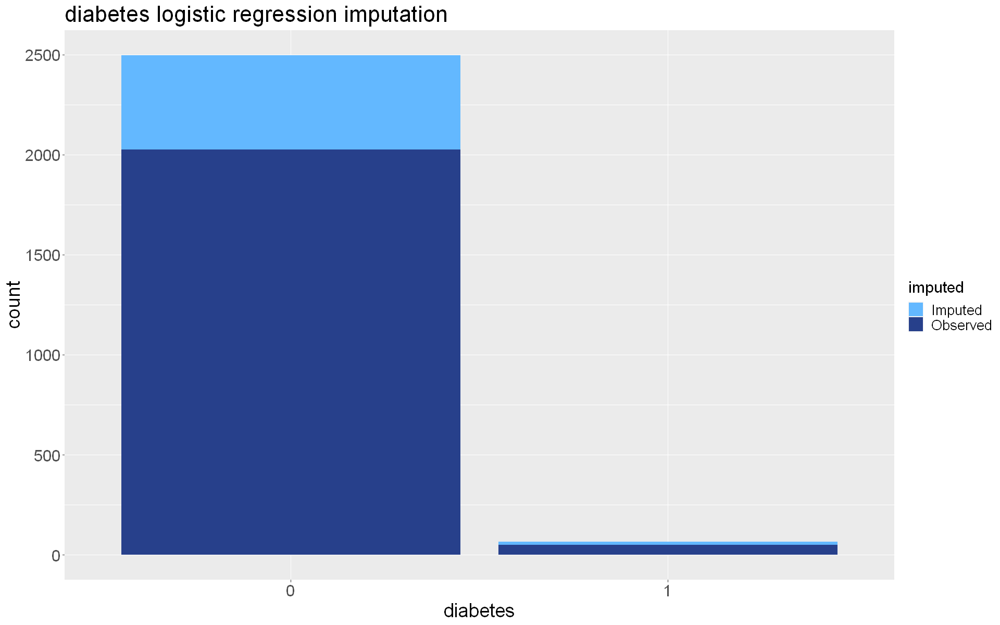

In [21]:
options(repr.plot.width = 16, repr.plot.height = 10)
plt1 <- visImpCat(train1, test1, imp_train1, imp_test1, "diabetes", "logistic regression")
plt1

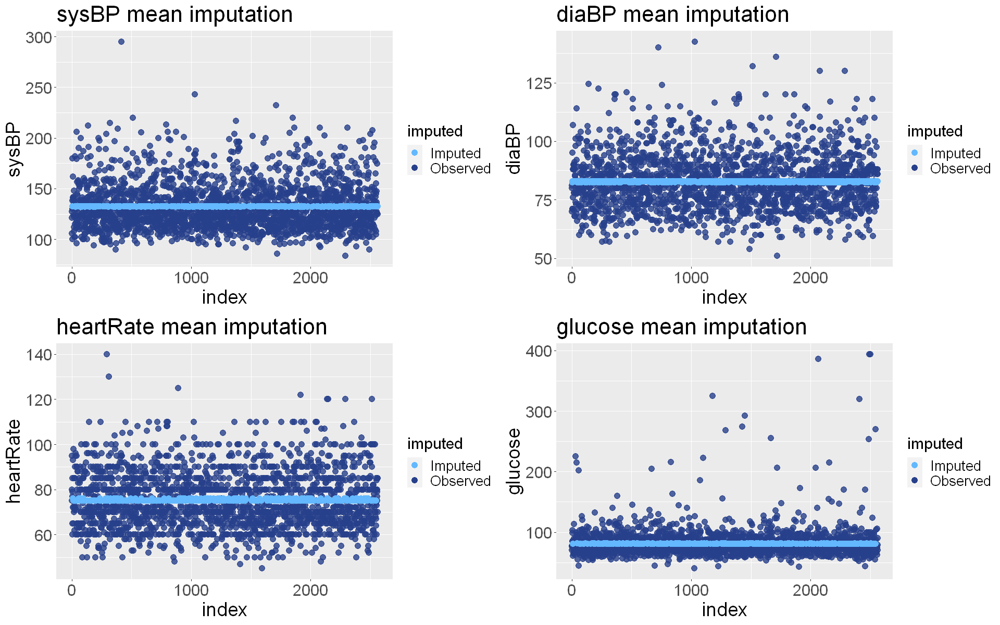

In [22]:
plt2 <- visImpCont(train1, test1, imp_train1, imp_test1, "sysBP", "mean")
plt3 <- visImpCont(train1, test1, imp_train1, imp_test1, "diaBP", "mean")
plt4 <- visImpCont(train1, test1, imp_train1, imp_test1, "heartRate", "mean")
plt5 <- visImpCont(train1, test1, imp_train1, imp_test1, "glucose", "mean")
plot_grid(plt2, plt3, plt4, plt5, ncol = 2)

##### Linear regression imputation

In [34]:
train2 <- train
method2 <- rep("", ncol(train2))
method2[9] <- "logreg"
method2[c(11, 12, 14, 15)] <- "norm.predict"
imp_train2 <- mice(train2, method=method2, m=1, maxit=1, predictorMatrix=predm_train) %>% complete()


 iter imp variable
  1   1  diabetes  sysBP  diaBP  heartRate  glucose


In [35]:
test2 <- test
imp_test2 <- mice(test2, method=method2, m=1, maxit=1, predictorMatrix=predm_test) %>% complete()


 iter imp variable
  1   1  diabetes  sysBP  diaBP  heartRate  glucose


In [36]:
intcols <- c("age", "cigsPerDay", "totChol", "heartRate", "glucose")
imp_train2[intcols] <- imp_train2[intcols] %>% lapply(as.integer)
imp_test2[intcols] <- imp_test2[intcols] %>% lapply(as.integer)

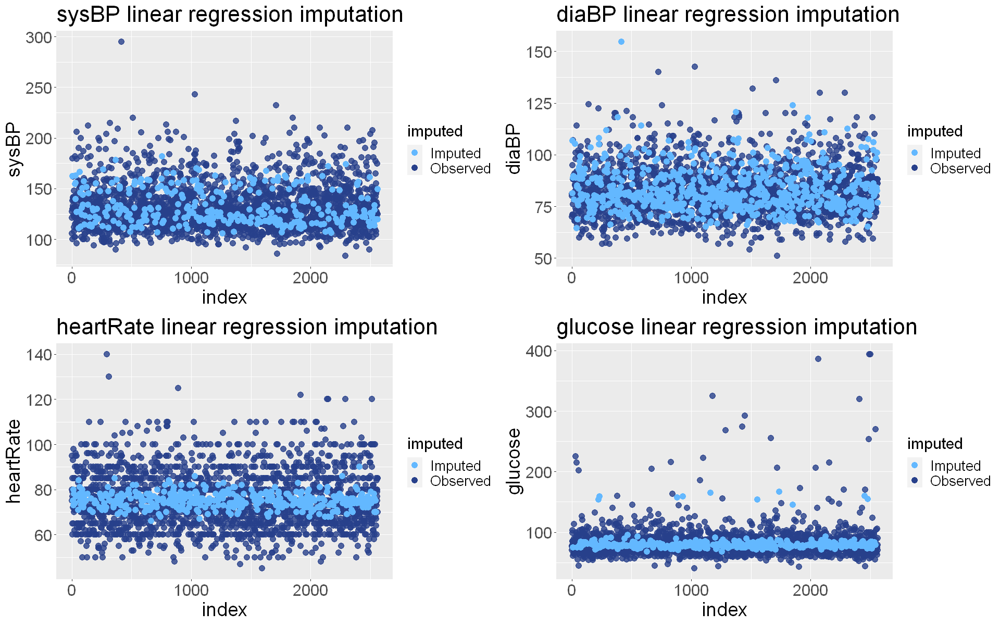

In [37]:
options(repr.plot.width = 16, repr.plot.height = 10)
plt2 <- visImpCont(train2, test2, imp_train2, imp_test2, "sysBP", "linear regression")
plt3 <- visImpCont(train2, test2, imp_train2, imp_test2, "diaBP", "linear regression")
plt4 <- visImpCont(train2, test2, imp_train2, imp_test2, "heartRate", "linear regression")
plt5 <- visImpCont(train2, test2, imp_train2, imp_test2, "glucose", "linear regression")
plot_grid(plt2, plt3, plt4, plt5, ncol = 2)

##### 3. Stochastic regression imputation

In [49]:
train3 <- train
method3 <- rep("", ncol(train3))
method3[9] <- "logreg"
method3[c(11, 12, 14, 15)] <- "norm.nob"
imp_train3 <- mice(train3, method=method3, m=1, maxit=1, predictorMatrix=predm_train) %>% complete()


 iter imp variable
  1   1  diabetes  sysBP  diaBP  heartRate  glucose


In [50]:
test3 <- test
imp_test3 <- mice(test3, method=method3, m=1, maxit=1, predictorMatrix=predm_test) %>% complete()


 iter imp variable
  1   1  diabetes  sysBP  diaBP  heartRate  glucose


In [51]:
intcols <- c("age", "cigsPerDay", "totChol", "heartRate", "glucose")
imp_train3[intcols] <- imp_train3[intcols] %>% lapply(as.integer)
imp_test3[intcols] <- imp_test3[intcols] %>% lapply(as.integer)

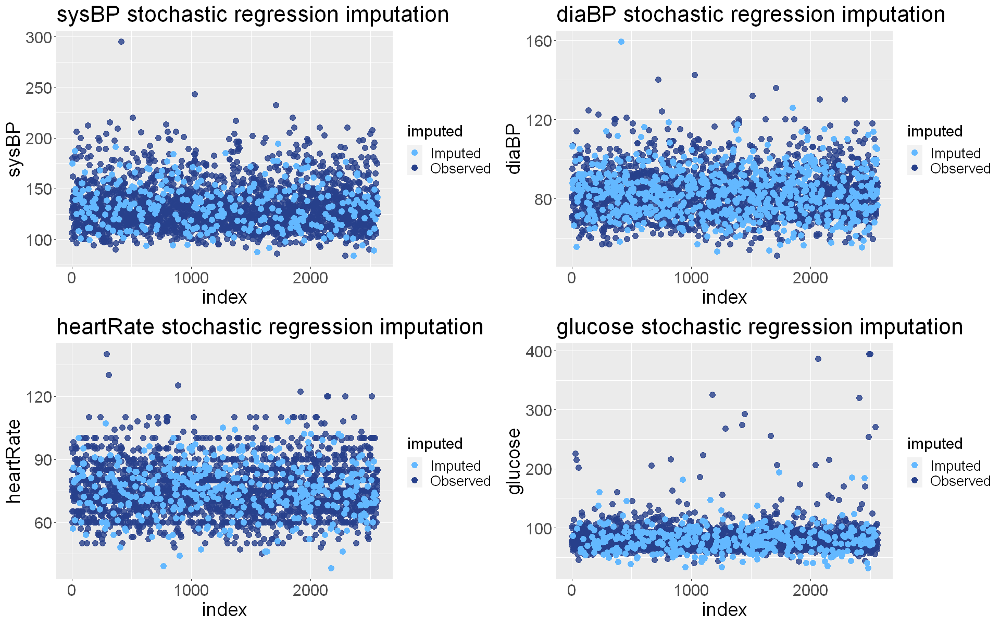

In [52]:
options(repr.plot.width = 16, repr.plot.height = 10)
plt2 <- visImpCont(train3, test3, imp_train3, imp_test3, "sysBP", "stochastic regression")
plt3 <- visImpCont(train3, test3, imp_train3, imp_test3, "diaBP", "stochastic regression")
plt4 <- visImpCont(train3, test3, imp_train3, imp_test3, "heartRate", "stochastic regression")
plt5 <- visImpCont(train3, test3, imp_train3, imp_test3, "glucose", "stochastic regression")
plot_grid(plt2, plt3, plt4, plt5, ncol = 2)

##### Predictive mean matching

In [64]:
train4 <- train
method4 <- rep("", ncol(train4))
method4[9] <- "logreg"
method4[c(11, 12, 14, 15)] <- "pmm"
imp_train4 <- mice(train4, method=method4, m=1, maxit=1, predictorMatrix=predm_train) %>% complete()


 iter imp variable
  1   1  diabetes  sysBP  diaBP  heartRate  glucose


In [65]:
test4 <- test
imp_test4 <- mice(test4, method=method4, m=1, maxit=1, predictorMatrix=predm_test) %>% complete()


 iter imp variable
  1   1  diabetes  sysBP  diaBP  heartRate  glucose


In [66]:
intcols <- c("age", "cigsPerDay", "totChol", "heartRate", "glucose")
imp_train4[intcols] <- imp_train4[intcols] %>% lapply(as.integer)
imp_test4[intcols] <- imp_test4[intcols] %>% lapply(as.integer)

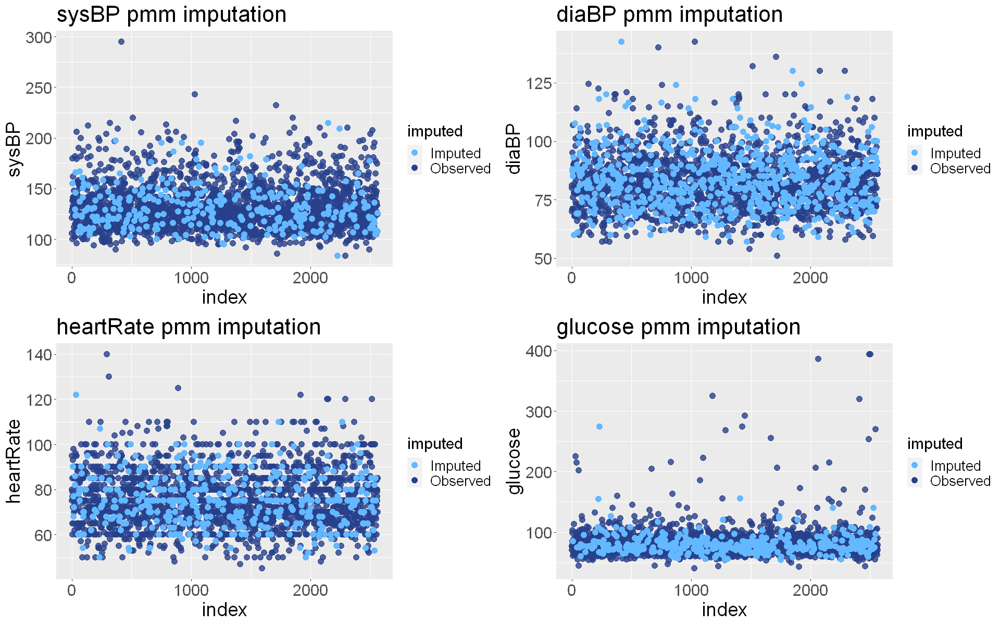

In [67]:
options(repr.plot.width = 16, repr.plot.height = 10)
plt2 <- visImpCont(train4, test4, imp_train4, imp_test4, "sysBP", "pmm")
plt3 <- visImpCont(train4, test4, imp_train4, imp_test4, "diaBP", "pmm")
plt4 <- visImpCont(train4, test4, imp_train4, imp_test4, "heartRate", "pmm")
plt5 <- visImpCont(train4, test4, imp_train4, imp_test4, "glucose", "pmm")
plot_grid(plt2, plt3, plt4, plt5, ncol = 2)

##### MICE with linear regression

In [79]:
train5 <- train
method5 <- rep("", ncol(train5))
method5[9] <- "logreg"
method5[c(11, 12, 14, 15)] <- "norm.predict"
imp_train5 <- mice(train5, method=method5, m=25, maxit=50, predictorMatrix=predm_train, printFlag = FALSE) %>% complete(action="long")
imp_train5 <- subset(imp_train5, select = -.id)

In [80]:
test5 <- test
imp_test5 <- mice(test5, method=method5, m=25, maxit=50, predictorMatrix=predm_test, printFlag = FALSE) %>% complete(action="long")
imp_test5 <- subset(imp_test5, select = -.id)

In [81]:
intcols <- c("age", "cigsPerDay", "totChol", "heartRate", "glucose")
imp_train5[intcols] <- imp_train5[intcols] %>% lapply(as.integer)
imp_test5[intcols] <- imp_test5[intcols] %>% lapply(as.integer)

In [82]:
orgtest <- rbind(test5, test5, test5, test5)
orgtrain <- rbind(train5, train5, train5, train5)
imptest <- subset(imp_test5, .imp <= 4)
imptrain <- subset(imp_train5, .imp <= 4)

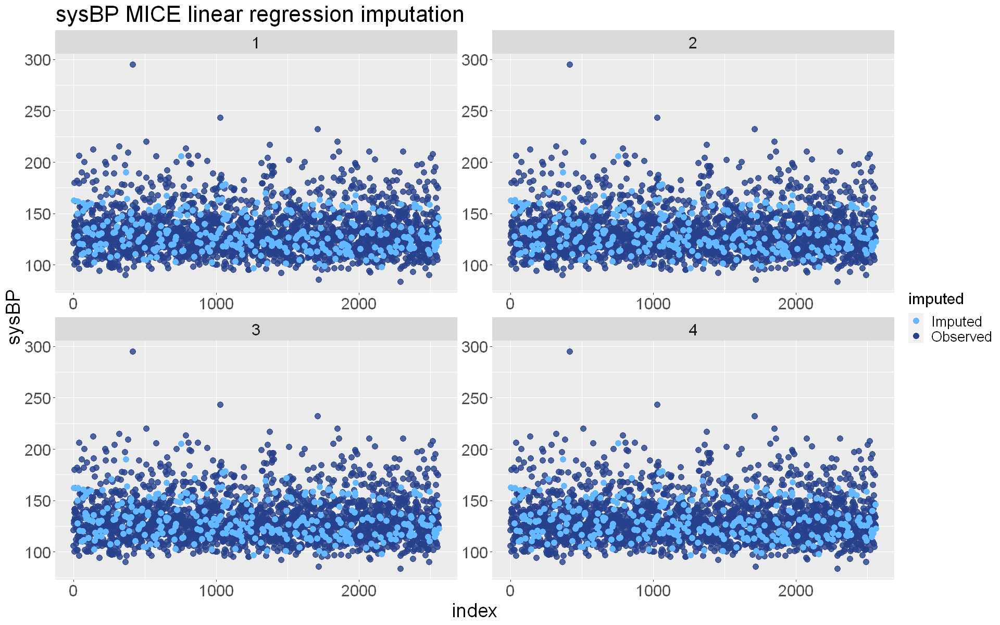

In [83]:
options(repr.plot.width = 16, repr.plot.height = 10)
visImpMul(orgtrain, orgtest, imptrain, imptest, "sysBP", "MICE linear regression")

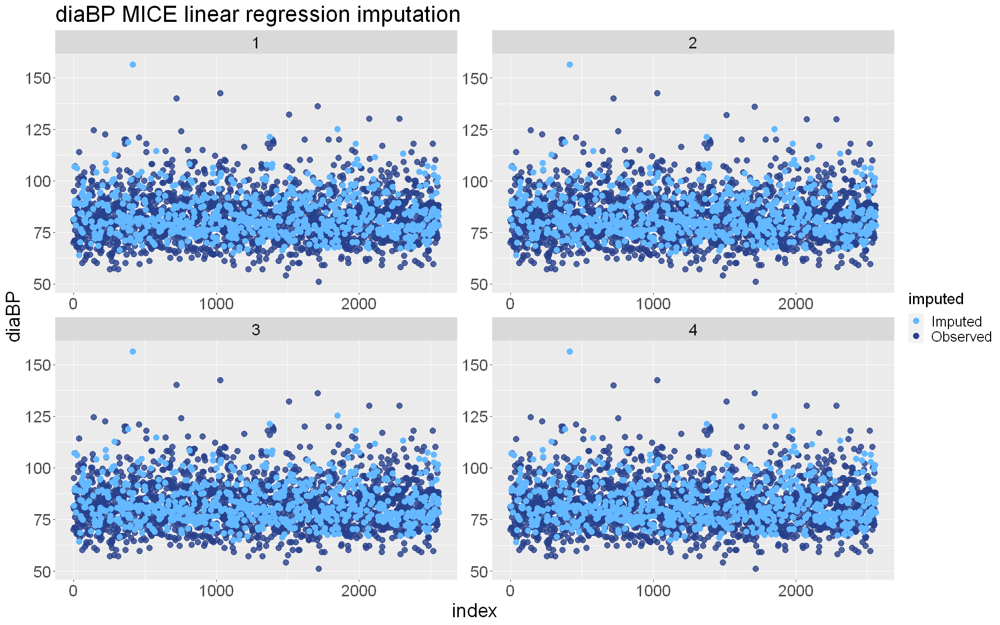

In [84]:
visImpMul(orgtrain, orgtest, imptrain, imptest, "diaBP", "MICE linear regression")

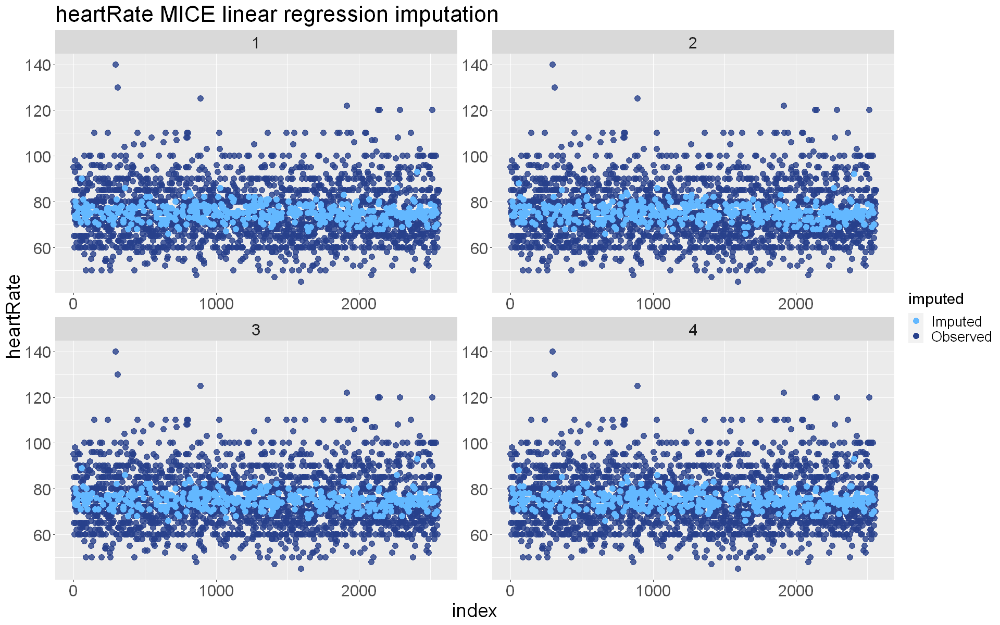

In [85]:
visImpMul(orgtrain, orgtest, imptrain, imptest, "heartRate", "MICE linear regression")

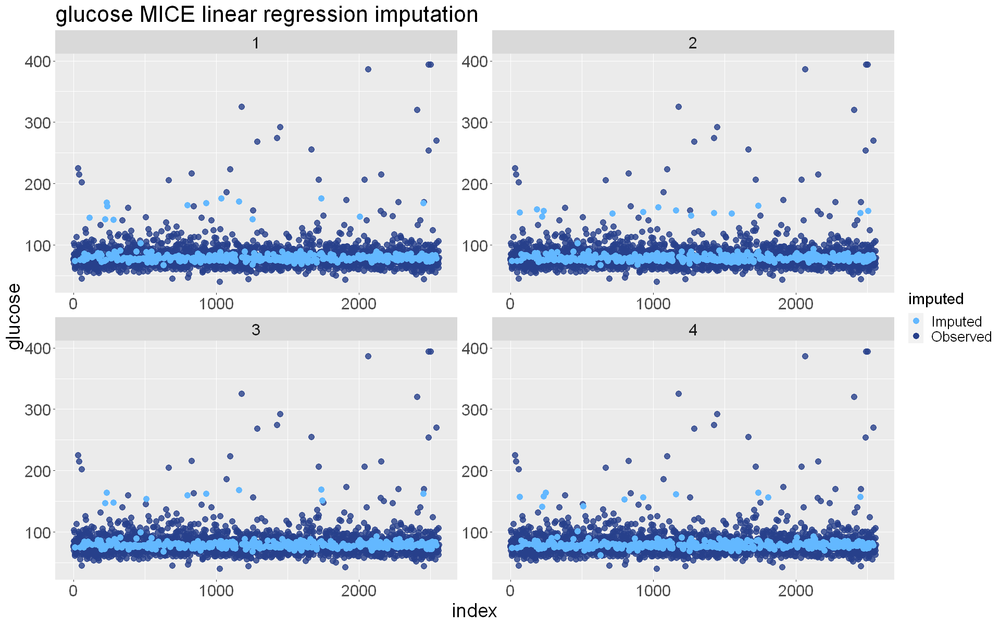

In [86]:
visImpMul(orgtrain, orgtest, imptrain, imptest, "glucose", "MICE linear regression")

##### MICE with stochastic regression

In [102]:
train6 <- train
method6 <- rep("", ncol(train6))
method6[9] <- "logreg"
method6[c(11, 12, 14, 15)] <- "norm.nob"
imp_train6 <- mice(train6, method=method6, m=25, maxit=50, predictorMatrix=predm_train, printFlag = FALSE) %>% complete(action="long")
imp_train6 <- subset(imp_train6, select = -.id)

In [103]:
test6 <- test
imp_test6 <- mice(test6, method=method6, m=25, maxit=50, predictorMatrix=predm_test, printFlag = FALSE) %>% complete(action="long")
imp_test6 <- subset(imp_test6, select = -.id)

In [104]:
intcols <- c("age", "cigsPerDay", "totChol", "heartRate", "glucose")
imp_train6[intcols] <- imp_train6[intcols] %>% lapply(as.integer)
imp_test6[intcols] <- imp_test6[intcols] %>% lapply(as.integer)

In [105]:
orgtest <- rbind(test6, test6, test6, test6)
orgtrain <- rbind(train6, train6, train6, train6)
imptest <- subset(imp_test6, .imp <= 4)
imptrain <- subset(imp_train6, .imp <= 4)

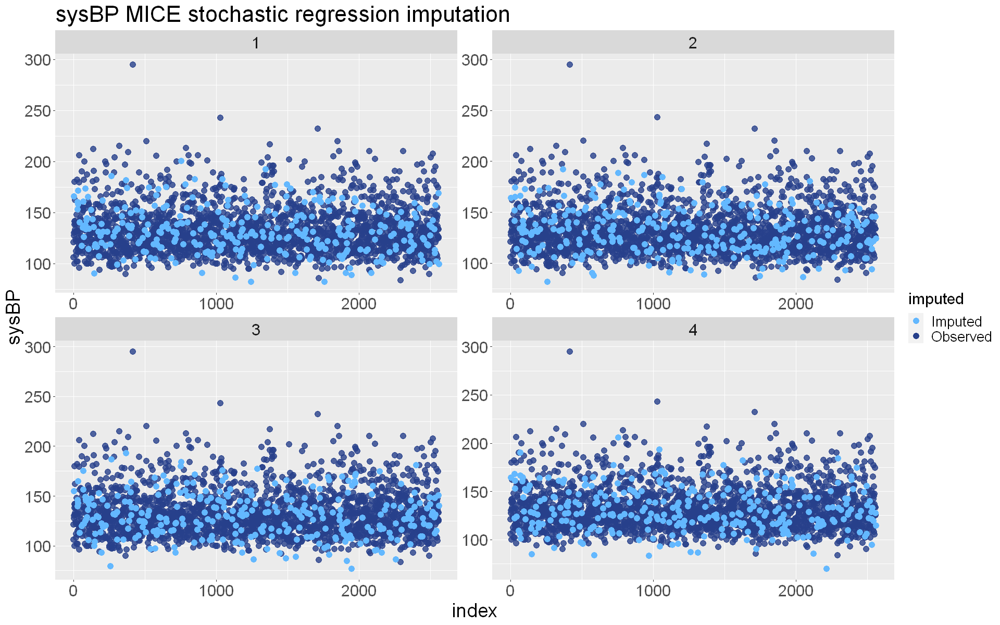

In [106]:
options(repr.plot.width = 16, repr.plot.height = 10)
visImpMul(orgtrain, orgtest, imptrain, imptest, "sysBP", "MICE stochastic regression")

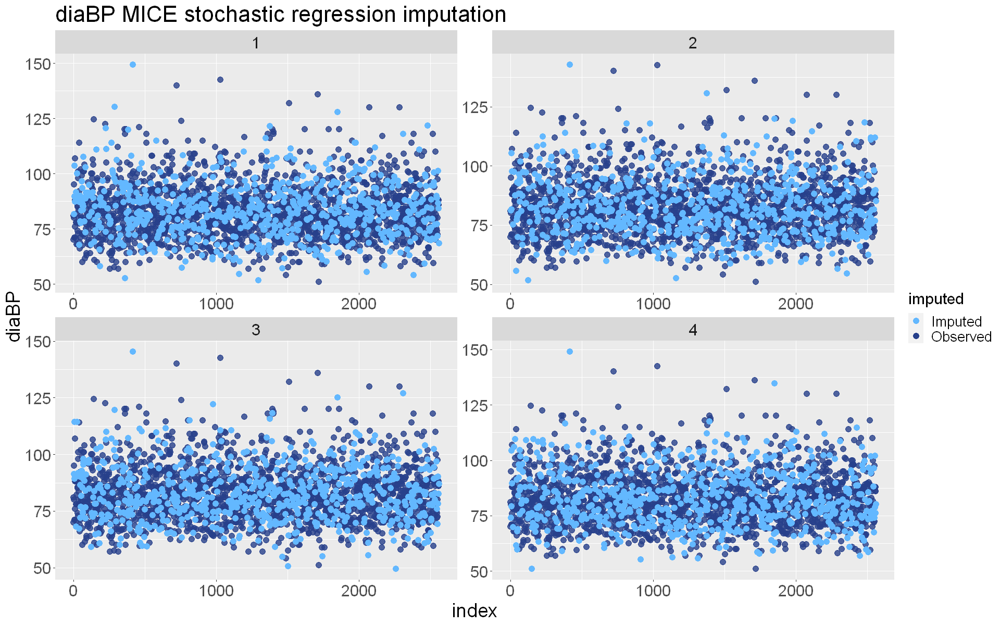

In [107]:
visImpMul(orgtrain, orgtest, imptrain, imptest, "diaBP", "MICE stochastic regression")

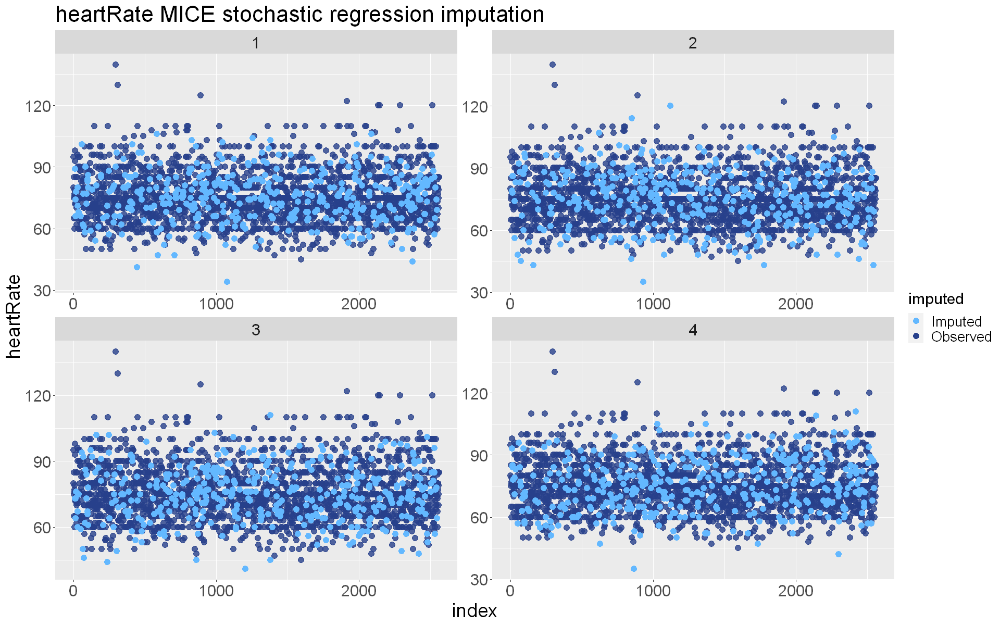

In [108]:
visImpMul(orgtrain, orgtest, imptrain, imptest, "heartRate", "MICE stochastic regression")

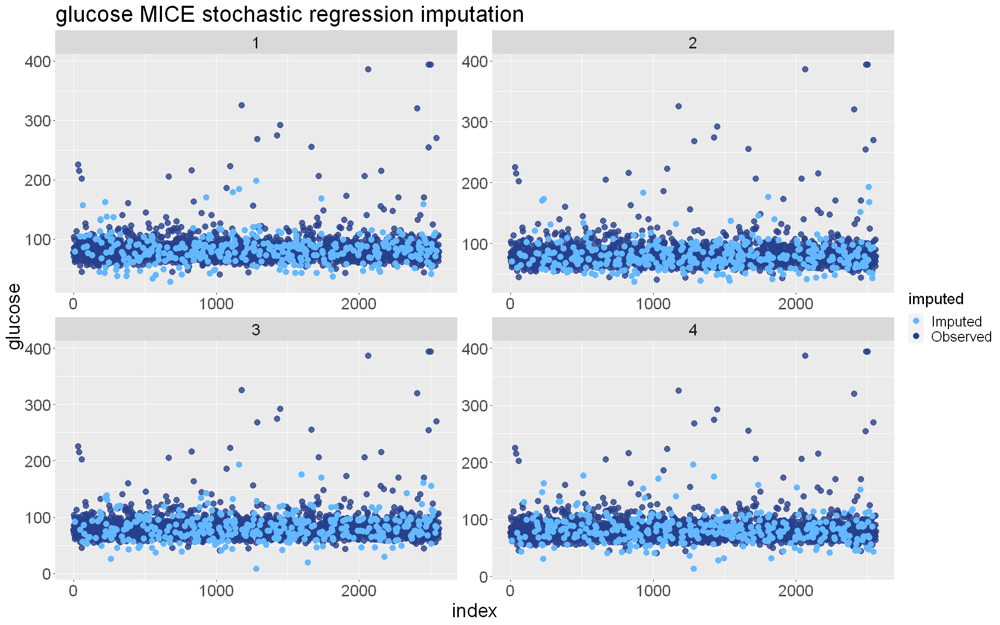

In [109]:
visImpMul(orgtrain, orgtest, imptrain, imptest, "glucose", "MICE stochastic regression")

##### MICE with pmm

In [125]:
train7 <- train
method7 <- rep("", ncol(train7))
method7[9] <- "logreg"
method7[c(11, 12, 14, 15)] <- "pmm"
imp_train7 <- mice(train7, method=method7, m=25, maxit=50, predictorMatrix=predm_train, printFlag = FALSE) %>% complete(action="long")
imp_train7 <- subset(imp_train7, select = -.id)

In [126]:
test7 <- test
imp_test7 <- mice(test7, method=method7, m=25, maxit=50, predictorMatrix=predm_test, printFlag = FALSE) %>% complete(action="long")
imp_test7 <- subset(imp_test7, select = -.id)

In [127]:
intcols <- c("age", "cigsPerDay", "totChol", "heartRate", "glucose")
imp_train7[intcols] <- imp_train7[intcols] %>% lapply(as.integer)
imp_test7[intcols] <- imp_test7[intcols] %>% lapply(as.integer)

In [128]:
orgtest <- rbind(test7, test7, test7, test7)
orgtrain <- rbind(train7, train7, train7, train7)
imptest <- subset(imp_test7, .imp <= 4)
imptrain <- subset(imp_train7, .imp <= 4)

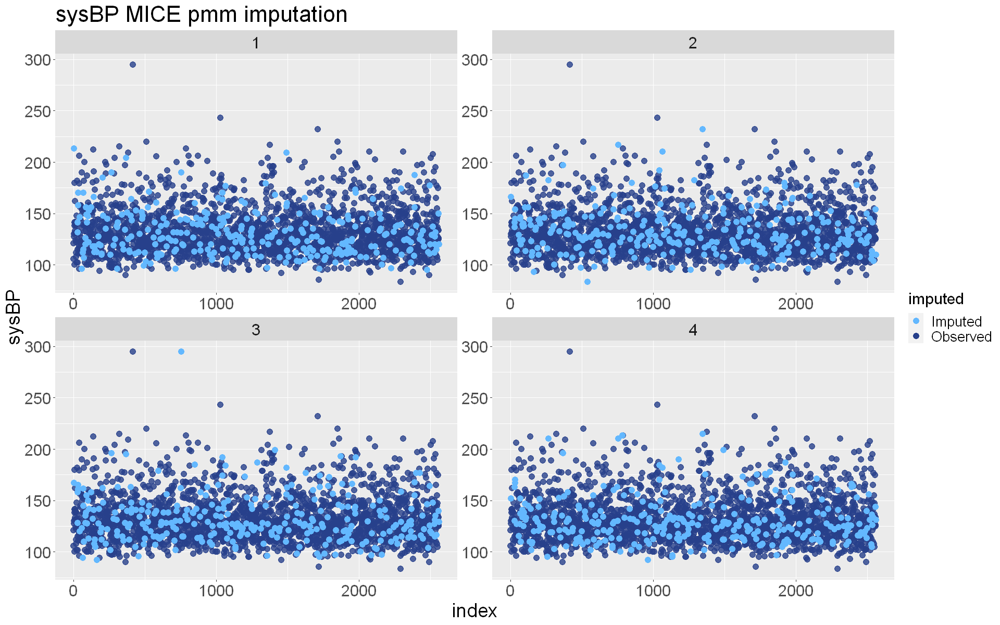

In [129]:
options(repr.plot.width = 16, repr.plot.height = 10)
visImpMul(orgtrain, orgtest, imptrain, imptest, "sysBP", "MICE pmm")

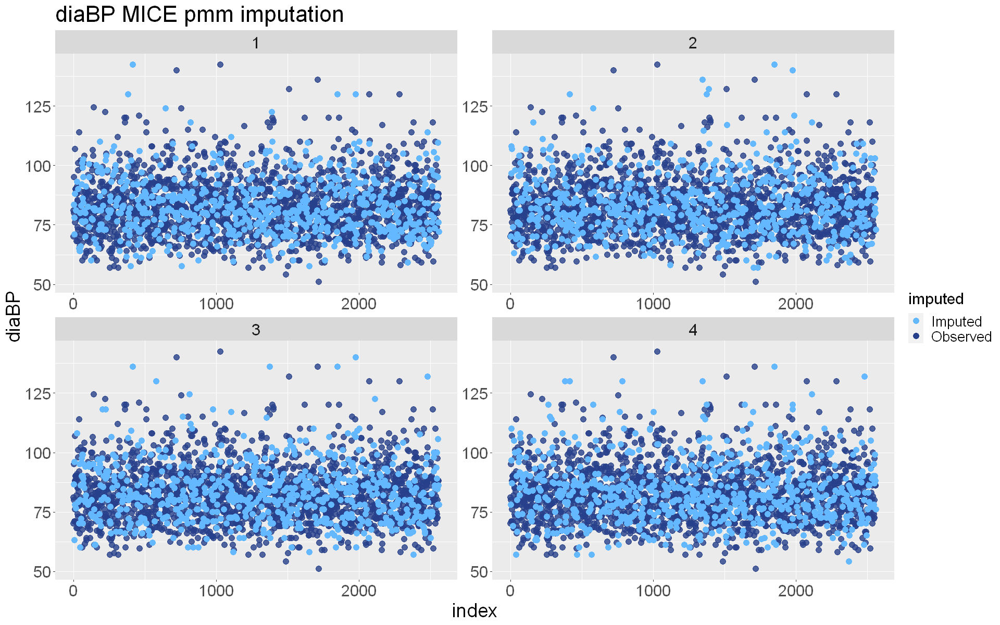

In [130]:
visImpMul(orgtrain, orgtest, imptrain, imptest, "diaBP", "MICE pmm")

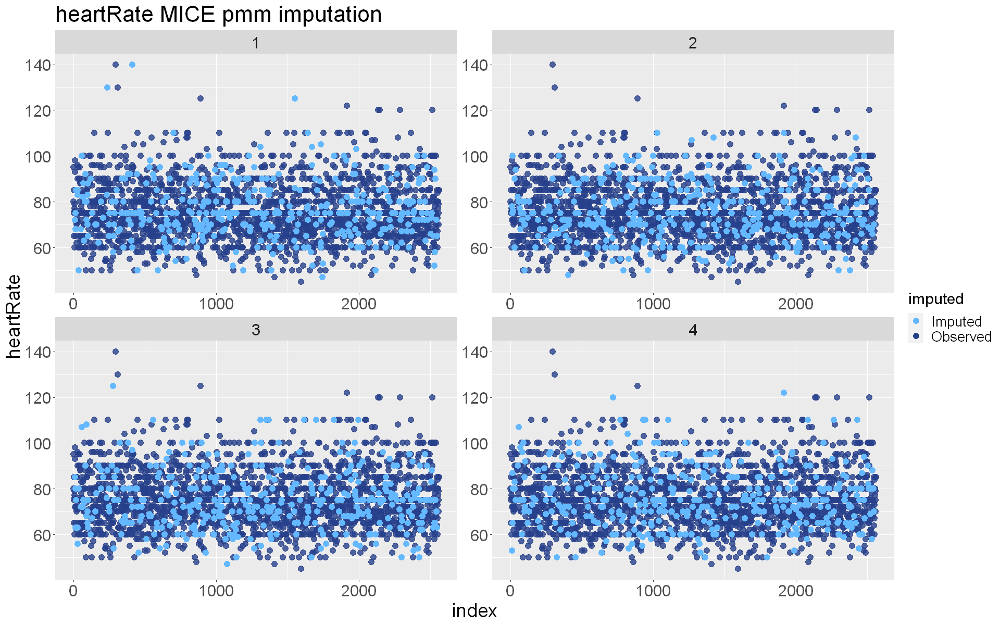

In [131]:
visImpMul(orgtrain, orgtest, imptrain, imptest, "heartRate", "MICE pmm")

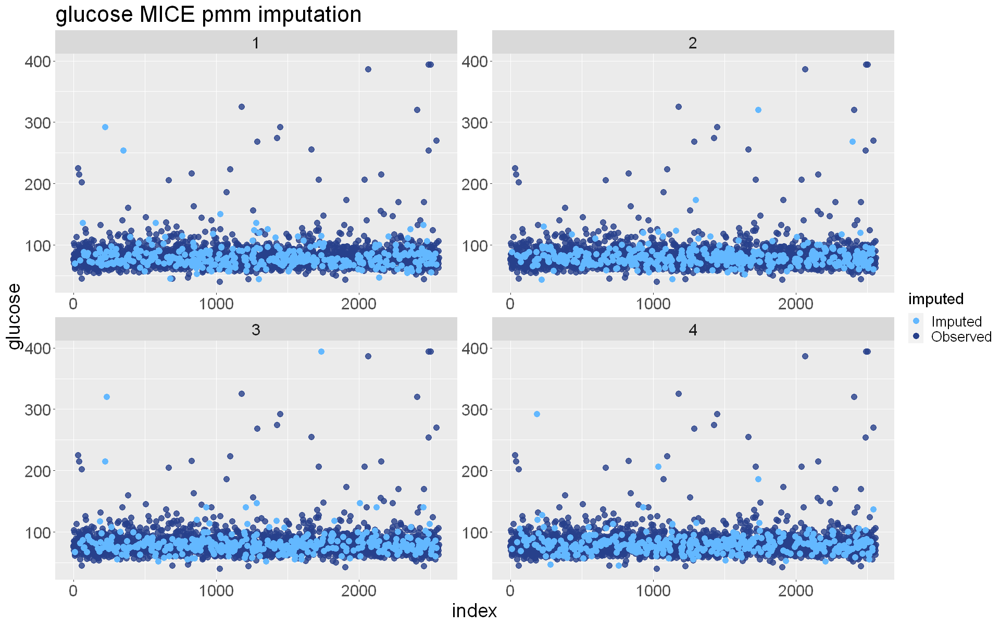

In [132]:
visImpMul(orgtrain, orgtest, imptrain, imptest, "glucose", "MICE pmm")

##### KNN imputation

In [148]:
train8 <- train
imp_train8 <- knnImputation(train8, scale=FALSE)

In [149]:
test8 <- test
imp_test8 <- knnImputation(test8, scale=FALSE)

In [150]:
intcols <- c("age", "cigsPerDay", "totChol", "heartRate", "glucose")
imp_train8[intcols] <- imp_train8[intcols] %>% lapply(as.integer)
imp_test8[intcols] <- imp_test8[intcols] %>% lapply(as.integer)

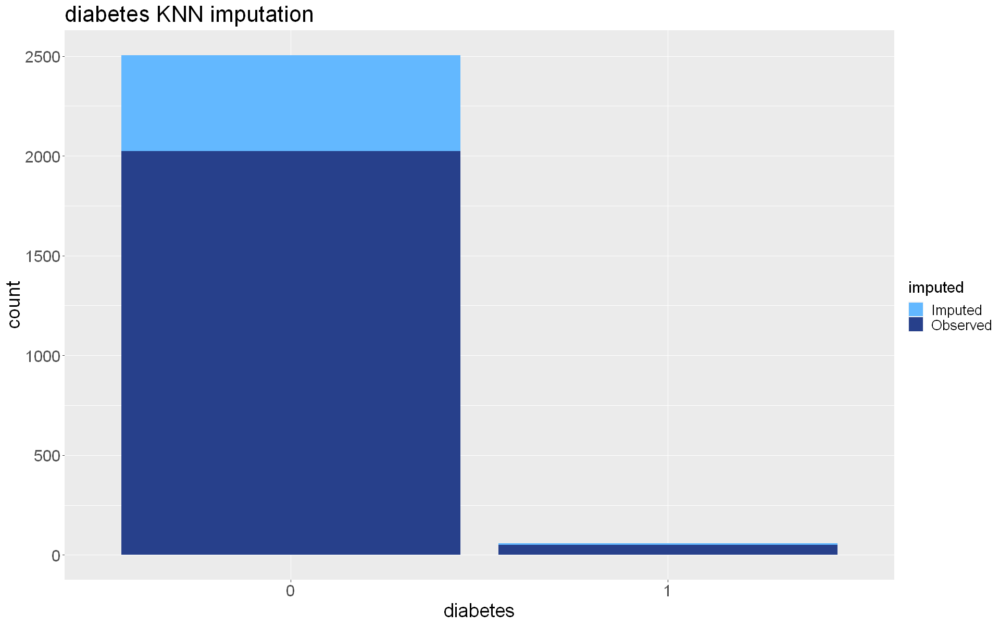

In [151]:
options(repr.plot.width = 16, repr.plot.height = 10)
plt1 <- visImpCat(train8, test8, imp_train8, imp_test8, "diabetes", "KNN")
plt1

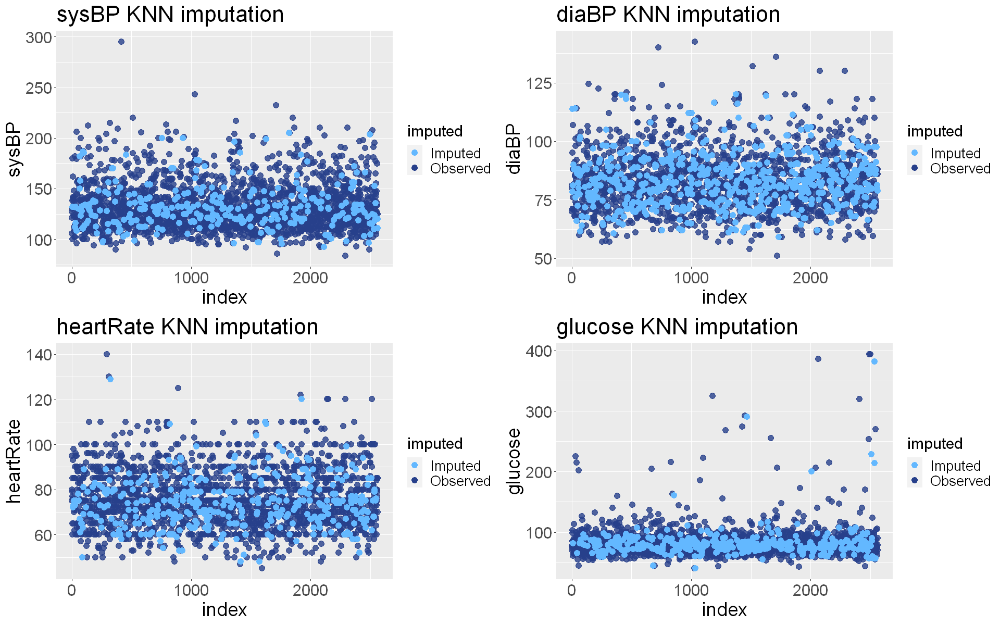

In [152]:
options(repr.plot.width = 16, repr.plot.height = 10)
plt2 <- visImpCont(train8, test8, imp_train8, imp_test8, "sysBP", "KNN")
plt3 <- visImpCont(train8, test8, imp_train8, imp_test8, "diaBP", "KNN")
plt4 <- visImpCont(train8, test8, imp_train8, imp_test8, "heartRate", "KNN")
plt5 <- visImpCont(train8, test8, imp_train8, imp_test8, "glucose", "KNN")
plot_grid(plt2, plt3, plt4, plt5, ncol = 2)

##### MLMI

In [164]:
train9 <- train
test9 <- test
train_index <- train9$index
test_index <- test9$index
train9_noind <- subset(train9, select = -index)
test9_noind <- subset(test9, select = -index)

In [165]:
cattrain9 <- train9_noind[, !(names(train9_noind) %in% ccols)]
cattest9 <- test9_noind[, !(names(test9_noind) %in% ccols)]
conttrain9 <- train9_noind[, !(names(train9_noind) %in% colnames(cattrain9))]
conttest9 <- test9_noind[, !(names(test9_noind) %in% colnames(cattest9))]

In [166]:
train9_noind <- cbind(cattrain9, conttrain9)
test9_noind <- cbind(cattest9, conttest9)
train9_noind[] <- lapply(train9_noind, function(x) if(is.factor(x)) as.integer(x) else x)
test9_noind[] <- lapply(test9_noind, function(x) if(is.factor(x)) as.integer(x) else x)

In [167]:
imp_train9 <- mixImp(obsData = train9_noind, nCat = 8, M = 25, rseed = 1234)
imp_test9 <- mixImp(obsData = test9_noind, nCat = 8, M = 25, rseed = 1234)

Imputing categorical variables using all 2-way associations.

Imputing continuous variables assuming main effects of categorical variables



Steps of ECM: 
1...2...3...4...5...6...7...8...9...10...11...12...13...14...15...16...17...18...19...20...21...22...23...24...


Imputing categorical variables using all 2-way associations.

Imputing continuous variables assuming main effects of categorical variables



Steps of ECM: 
1...2...3...4...5...6...7...8...9...10...11...12...13...14...15...16...17...18...19...20...21...


In [168]:
imp_train9_df <- imp_train9[[1]]
imp_train9_df$.imp <- 1
imp_train9_df$index <- train_index
imp_test9_df <- imp_test9[[1]]
imp_test9_df$.imp <- 1
imp_test9_df$index <- test_index

for (i in 2:25) {
    imp_train_i <- imp_train9[[i]]
    imp_train_i$.imp <- i
    imp_train_i$index <- train_index
    imp_train9_df <- rbind(imp_train9_df, imp_train_i)

    imp_test_i <- imp_test9[[i]]
    imp_test_i$.imp <- i
    imp_test_i$index <- test_index
    imp_test9_df <- rbind(imp_test9_df, imp_test_i)
}

In [169]:
imp_train9_df[fcols] <- imp_train9_df[fcols] %>% lapply(factor)
imp_test9_df[fcols] <- imp_test9_df[fcols] %>% lapply(factor)

In [170]:
imp_train9_df$male <- ifelse(imp_train9_df$male == 1, 0, 1)
imp_test9_df$male <- ifelse(imp_test9_df$male == 1, 0, 1)
imp_train9_df$currentSmoker <- ifelse(imp_train9_df$currentSmoker == 1, 0, 1)
imp_test9_df$currentSmoker <- ifelse(imp_test9_df$currentSmoker == 1, 0, 1)
imp_train9_df$BPMeds <- ifelse(imp_train9_df$BPMeds == 1, 0, 1)
imp_test9_df$BPMeds <- ifelse(imp_test9_df$BPMeds == 1, 0, 1)
imp_train9_df$prevalentStroke <- ifelse(imp_train9_df$prevalentStroke == 1, 0, 1)
imp_test9_df$prevalentStroke <- ifelse(imp_test9_df$prevalentStroke == 1, 0, 1)
imp_train9_df$prevalentHyp <- ifelse(imp_train9_df$prevalentHyp == 1, 0, 1)
imp_test9_df$prevalentHyp <- ifelse(imp_test9_df$prevalentHyp == 1, 0, 1)
imp_train9_df$diabetes <- ifelse(imp_train9_df$diabetes == 1, 0, 1)
imp_test9_df$diabetes <- ifelse(imp_test9_df$diabetes == 1, 0, 1)
imp_train9_df$TenYearCHD <- ifelse(imp_train9_df$TenYearCHD == 1, 0, 1)
imp_test9_df$TenYearCHD <- ifelse(imp_test9_df$TenYearCHD == 1, 0, 1)

In [171]:
imp_train9_df[fcols] <- imp_train9_df[fcols] %>% lapply(factor)
imp_test9_df[fcols] <- imp_test9_df[fcols] %>% lapply(factor)

intcols <- c("age", "cigsPerDay", "totChol", "heartRate", "glucose")
imp_train9_df[intcols] <- imp_train9_df[intcols] %>% lapply(as.integer)
imp_test9_df[intcols] <- imp_test9_df[intcols] %>% lapply(as.integer)

In [172]:
orgtest <- rbind(test9, test9, test9, test9)
orgtrain <- rbind(train9, train9, train9, train9)
imptest <- subset(imp_test9_df, .imp <= 4)
imptrain <- subset(imp_train9_df, .imp <= 4)

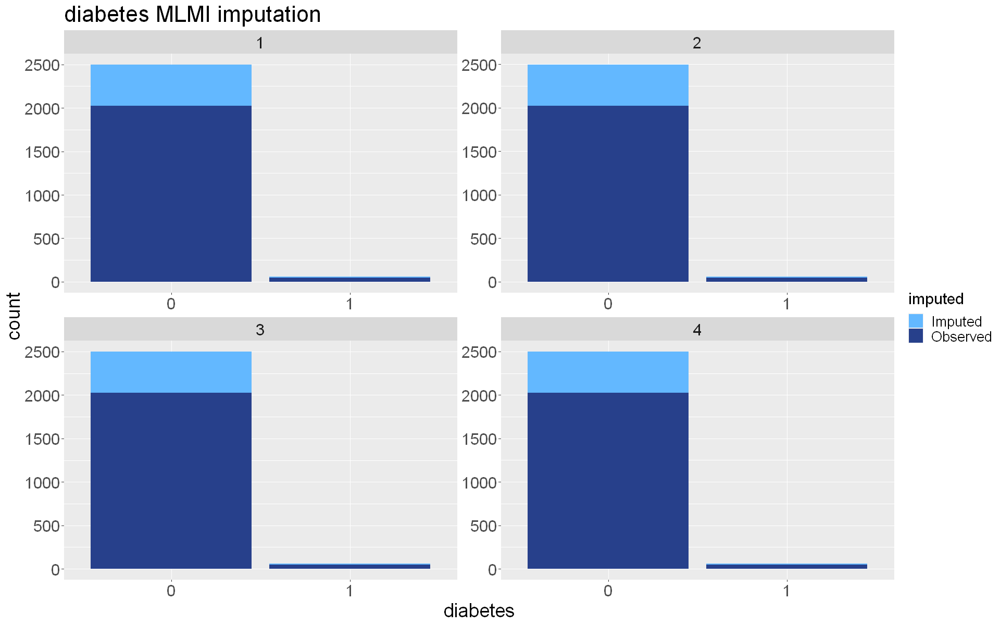

In [173]:
options(repr.plot.width = 16, repr.plot.height = 10)
visImpMulCat(orgtrain, orgtest, imptrain, imptest, "diabetes", "MLMI")

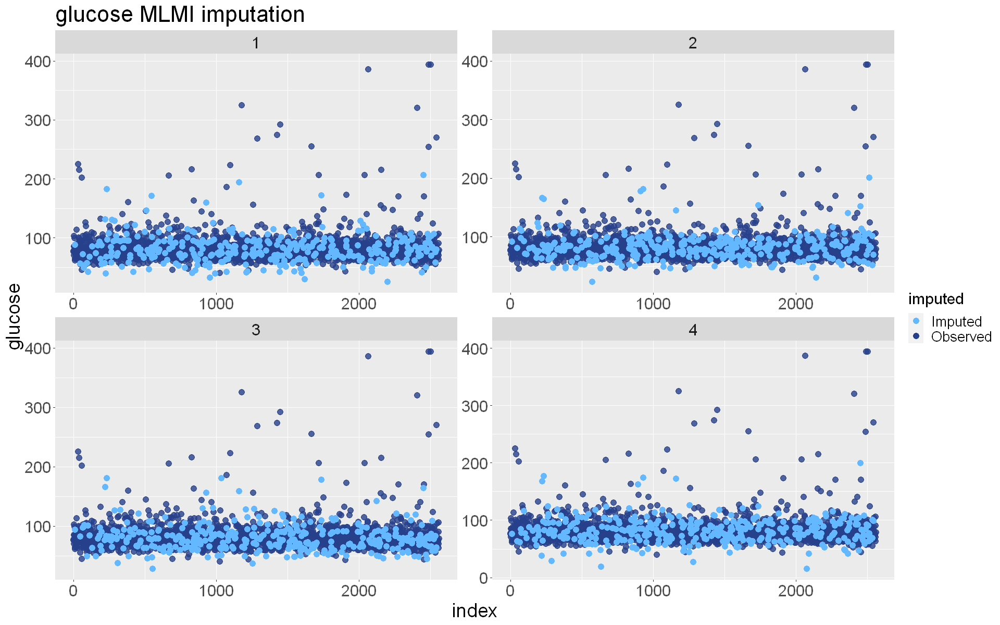

In [174]:
visImpMul(orgtrain, orgtest, imptrain, imptest, "glucose", "MLMI")

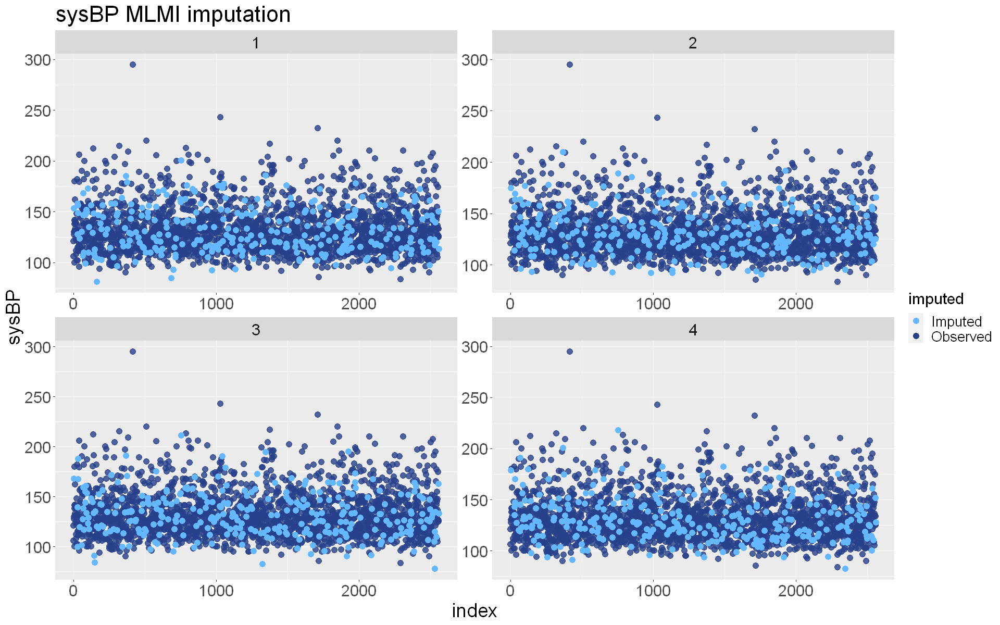

In [175]:
visImpMul(orgtrain, orgtest, imptrain, imptest, "sysBP", "MLMI")

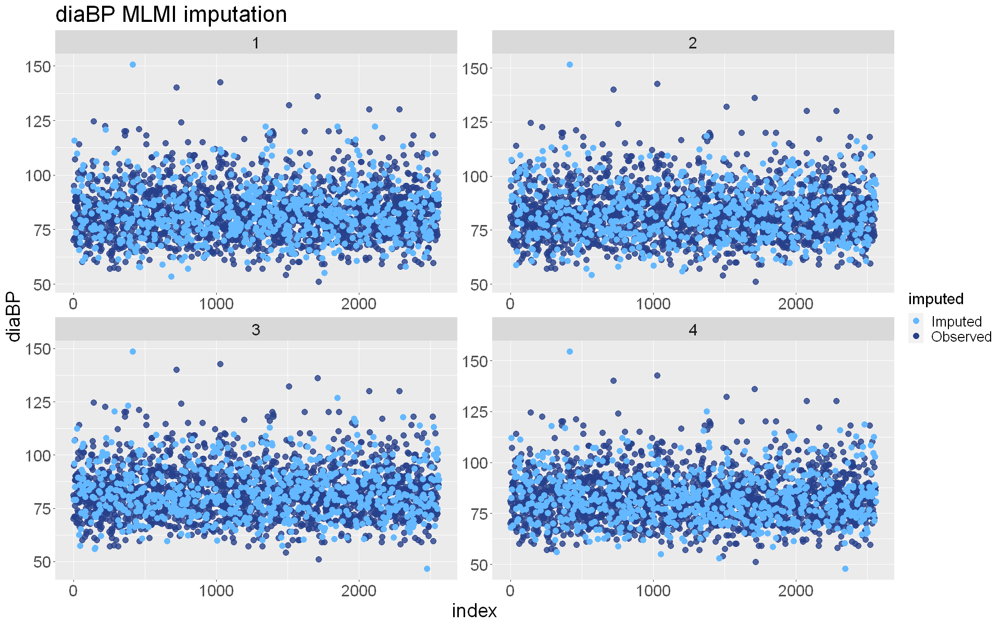

In [176]:
visImpMul(orgtrain, orgtest, imptrain, imptest, "diaBP", "MLMI")

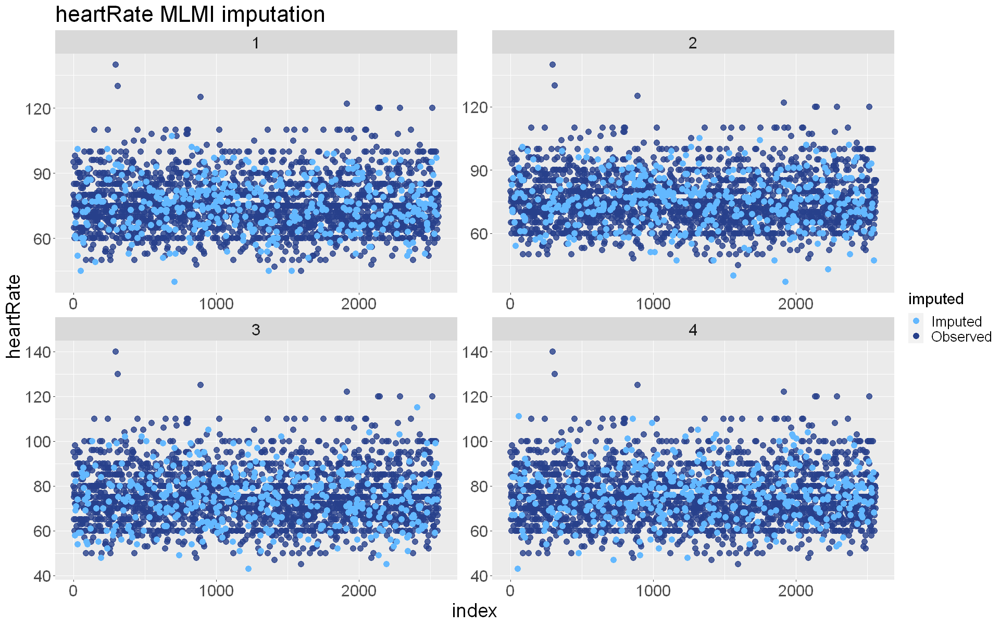

In [177]:
visImpMul(orgtrain, orgtest, imptrain, imptest, "heartRate", "MLMI")

##### Decision tree imputation

In [193]:
train10 <- train
method10 <- rep("", ncol(train1))
method10[c(9, 11, 12, 14, 15)] <- "cart"
imp_train10 <- mice(train1, method=method1, m=1, maxit=1, predictorMatrix=predm_train) %>% complete()


 iter imp variable
  1   1  diabetes  sysBP  diaBP  heartRate  glucose


In [194]:
test10 <- test
imp_test10 <- mice(test10, method=method10, m=1, maxit=1, predictorMatrix=predm_test) %>% complete()


 iter imp variable
  1   1  diabetes  sysBP  diaBP  heartRate  glucose


In [195]:
intcols <- c("age", "cigsPerDay", "totChol", "heartRate", "glucose")
imp_train10[intcols] <- imp_train10[intcols] %>% lapply(as.integer)
imp_test10[intcols] <- imp_test10[intcols] %>% lapply(as.integer)

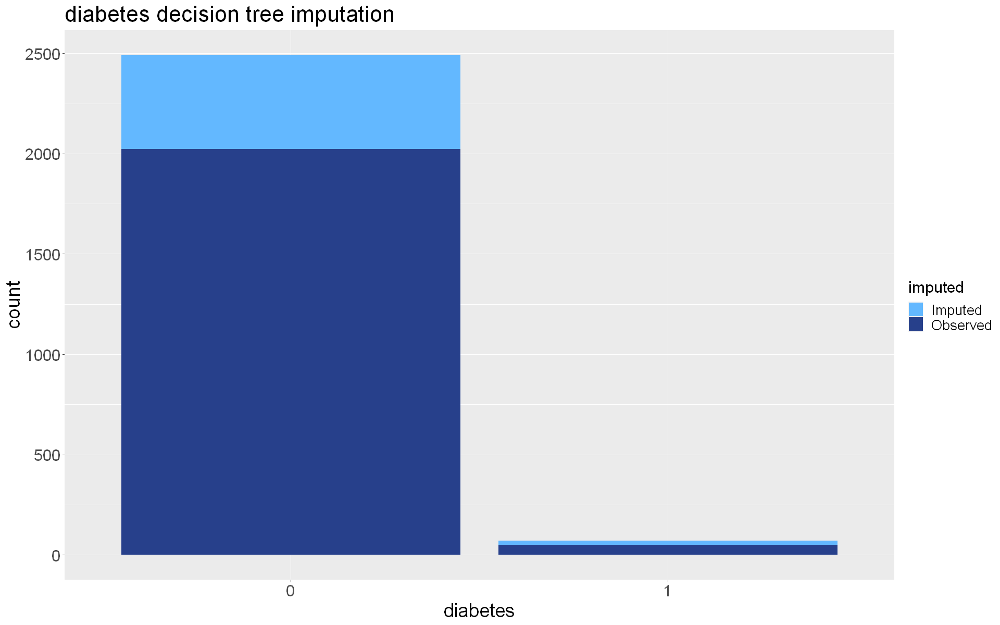

In [196]:
options(repr.plot.width = 16, repr.plot.height = 10)
plt1 <- visImpCat(train10, test10, imp_train10, imp_test10, "diabetes", "decision tree")
plt1

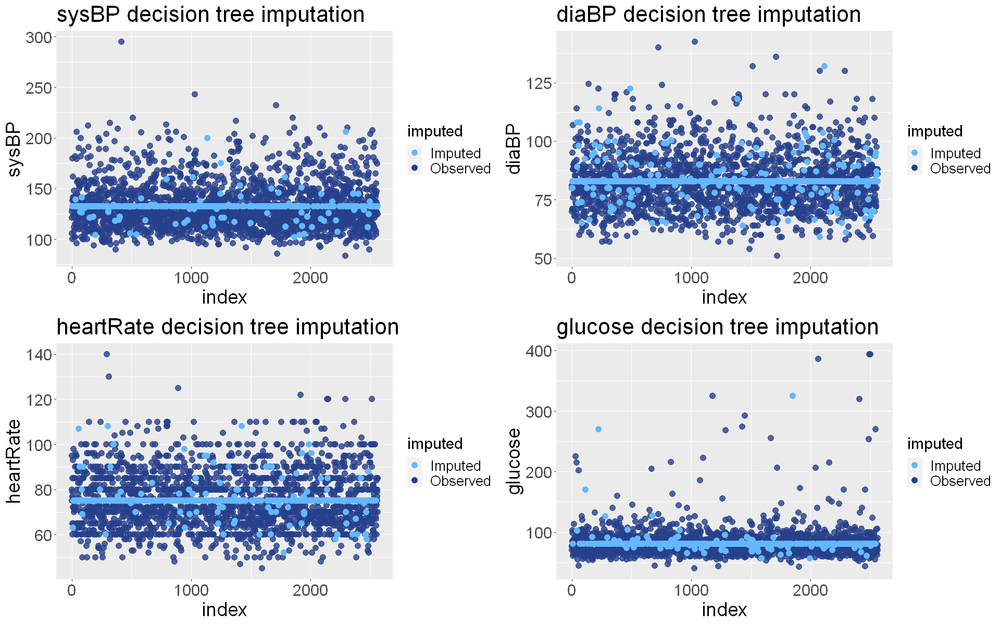

In [197]:
options(repr.plot.width = 16, repr.plot.height = 10)
plt2 <- visImpCont(train10, test10, imp_train10, imp_test10, "sysBP", "decision tree")
plt3 <- visImpCont(train10, test10, imp_train10, imp_test10, "diaBP", "decision tree")
plt4 <- visImpCont(train10, test10, imp_train10, imp_test10, "heartRate", "decision tree")
plt5 <- visImpCont(train10, test10, imp_train10, imp_test10, "glucose", "decision tree")
plot_grid(plt2, plt3, plt4, plt5, ncol = 2)

##### Random forest imputation

In [209]:
train11 <- train
method11 <- rep("", ncol(train11))
method11[c(9, 11, 12, 14, 15)] <- "rf"
imp_train11 <- mice(train11, method=method11, m=1, maxit=1, predictorMatrix=predm_train) %>% complete()


 iter imp variable
  1   1  diabetes  sysBP  diaBP  heartRate  glucose


In [210]:
test11 <- test
imp_test11 <- mice(test11, method=method11, m=1, maxit=1, predictorMatrix=predm_test) %>% complete()


 iter imp variable
  1   1  diabetes  sysBP  diaBP  heartRate  glucose


In [211]:
intcols <- c("age", "cigsPerDay", "totChol", "heartRate", "glucose")
imp_train11[intcols] <- imp_train11[intcols] %>% lapply(as.integer)
imp_test11[intcols] <- imp_test11[intcols] %>% lapply(as.integer)

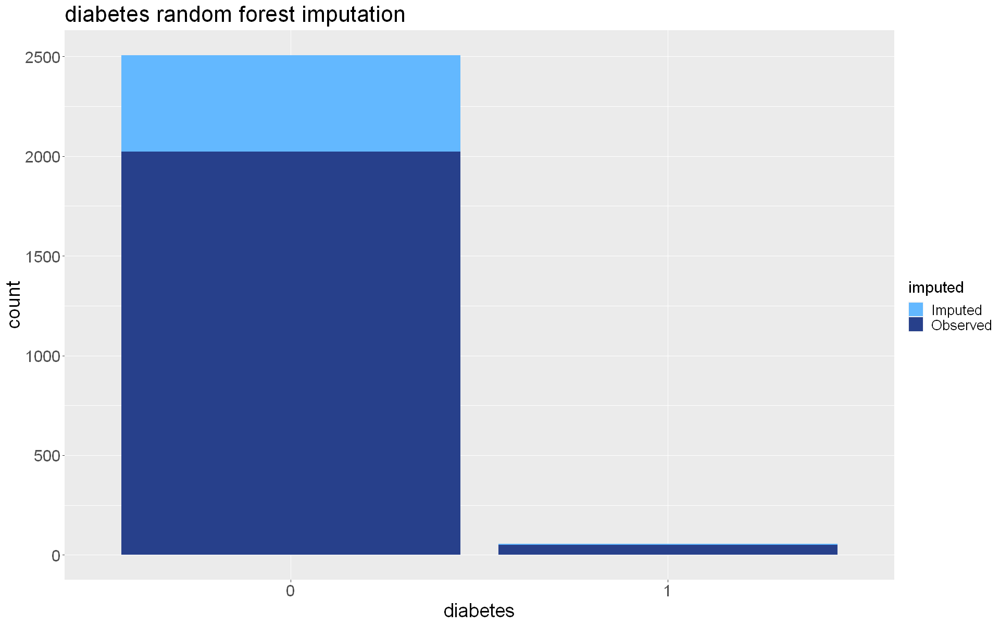

In [212]:
options(repr.plot.width = 16, repr.plot.height = 10)
plt1 <- visImpCat(train11, test11, imp_train11, imp_test11, "diabetes", "random forest")
plt1

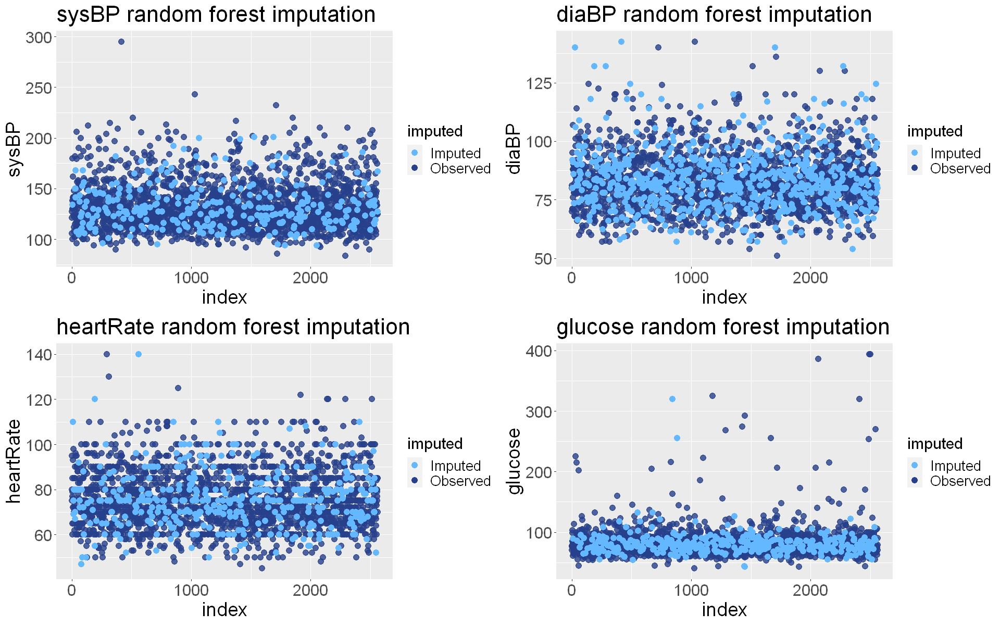

In [213]:
options(repr.plot.width = 16, repr.plot.height = 10)
plt2 <- visImpCont(train11, test11, imp_train11, imp_test11, "sysBP", "random forest")
plt3 <- visImpCont(train11, test11, imp_train11, imp_test11, "diaBP", "random forest")
plt4 <- visImpCont(train11, test11, imp_train11, imp_test11, "heartRate", "random forest")
plt5 <- visImpCont(train11, test11, imp_train11, imp_test11, "glucose", "random forest")
plot_grid(plt2, plt3, plt4, plt5, ncol = 2)

##### Simulations

In [15]:
fram_mcar <- read.csv("fram_mcar_num.csv")
fram <- read.csv("Framingham.csv")
fcols <- c("male", "education", "currentSmoker", "BPMeds", "prevalentStroke", "prevalentHyp", "diabetes", "TenYearCHD")
fcols2 <- c("male", "education", "currentSmoker", "BPMeds", "prevalentStroke", "prevalentHyp", "diabetes")
ccols <- c("age", "cigsPerDay", "totChol", "sysBP", "diaBP", "BMI", "heartRate", "glucose")
intcols <- c("age", "cigsPerDay", "totChol", "heartRate", "glucose")
fram_mcar[fcols] <- fram_mcar[fcols] %>% lapply(factor)
fram[fcols] <- fram[fcols] %>% lapply(factor)

In [16]:
method1_cls <- rep("", ncol(fram_mcar))
method1_cls[c(11, 12, 14, 15)] <- "mean"

In [46]:
sim1 <- simulate(fram_mcar, "TenYearCHD", 100, method1_cls, 1, 1, "mean.csv", intcols, fcols2)


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose


Warning message:
"Number of logged events: 1"


[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7928098; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6535796; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6535796; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6197938; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5083134; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5083134; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7792998; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6684932; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6684932; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6684932; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5044140; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5044140; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7691843; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6374622; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6374622; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.5311178; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5081571; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5081571; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7830735; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6619446; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6619446; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.5670160; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5094859; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5094859; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7752472; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6687906; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6687906; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6687906; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.4921014; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.4921014; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.8014015; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6724169; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6724169; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6724169; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5071164; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5071164; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7901769; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6715052; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6715052; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6715052; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.4947455; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.4947455; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"
[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.8001805; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6834975; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6834975; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6834975; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5078609; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5078609; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7954111; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6630341; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6630341; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6630341; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5080122; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5080122; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"
[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7981900; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6787330; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6787330; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6787330; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5088989; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5088989; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7991932; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6667769; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6667769; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6667769; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.4925725; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.4925725; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"
[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7897126; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6490166; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6490166; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.5573374; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.4895613; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.4895613; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7967287; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6680014; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6680014; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6680014; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.4930648; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.4930648; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7960360; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6592341; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6592341; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6592341; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.4896273; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.4896273; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7963636; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6663636; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6663636; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6663636; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.4884848; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.4884848; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, 

[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7789755; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6359521; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6359521; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.5097858; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5097858; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5097858; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"
[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.8006098; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6411585; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6411585; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.5243902; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5036585; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5036585; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7837349; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6656627; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6656627; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6295181; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5096386; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5096386; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"
[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.8080757; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6499005; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6499005; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6188764; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5094954; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5094954; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"
[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7684370; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6446131; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6446131; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.5295903; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5059181; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5059181; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm

[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7734139; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6441088; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6441088; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.5516616; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5081571; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5081571; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7606061; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6718182; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6718182; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6718182; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5066667; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5066667; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"
[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7810526; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6415038; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6415038; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.5103759; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5103759; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5103759; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message:
"glm.fit: al

[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7877069; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6632476; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6632476; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6287022; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.4906106; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.4906106; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"
[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7724305; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6343418; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6343418; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.5112610; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5112610; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5112610; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"
[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7836593; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6443854; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6443854; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.5713204; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.4806566; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.4806566; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7665871; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6609897; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6609897; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.5861038; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5045616; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5045616; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"
[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7972219; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6679678; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6679678; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6679678; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5094873; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5094873; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7750872; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6662664; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6662664; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6662664; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5078628; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5078628; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7835099; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6434230; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6434230; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.5837260; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.4933301; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.4933301; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7962056; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6590270; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6590270; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.5087382; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.4821327; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.4821327; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7786990; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6572077; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6572077; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.5540016; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.4838228; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.4838228; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose


Warning message:
"Number of logged events: 1"


[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7715170; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6538700; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6538700; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.4835913; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.4835913; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.4835913; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"
[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.8080743; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6541144; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6541144; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.5584703; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5056270; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5056270; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"
[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7896089; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6508766; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6508766; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6508766; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5057682; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5057682; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7993382; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6458095; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6458095; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6458095; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.4832255; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.4832255; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose


Warning message:
"Number of logged events: 2"


[1] "test: TRUE"
[1] 0
[1] "data: TRUE"
[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7974025; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6549771; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6549771; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.4907876; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.4907876; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.4907876; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose


Warning message:
"Number of logged events: 2"


[1] "test: TRUE"
[1] 0
[1] "data: TRUE"
[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7778499; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6513723; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6513723; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.5085987; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5085987; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5085987; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7671045; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6641402; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6641402; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6271705; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5069582; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5069582; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose


Warning message:
"Number of logged events: 1"


[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7859525; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6567325; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6567325; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.5275069; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.4904248; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.4904248; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose


Warning message:
"Number of logged events: 1"


[1] "test: TRUE"
[1] 0
[1] "data: TRUE"
[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7665193; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6411324; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6411324; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6411324; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.4966054; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.4966054; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"
[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7765244; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6615854; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6615854; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6615854; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.4920732; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.4920732; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7981147; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6459502; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6459502; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.5122573; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.4861967; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.4861967; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"
[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7902566; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6621108; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6621108; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6621108; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5051182; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5051182; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.8012842; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6663731; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6663731; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6184342; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.4926797; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.4926797; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"
[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7694066; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6724866; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6724866; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6724866; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5099357; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5099357; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7924381; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6495722; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6495722; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6175112; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.4926797; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.4926797; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose


Warning message:
"Number of logged events: 1"


[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7854727; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6625534; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6625534; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.5944316; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5094918; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5094918; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7802858; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6654623; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6654623; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.5915297; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5106681; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5106681; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, t

[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7946637; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6444519; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6444519; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.5511727; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.4769853; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.4769853; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"
[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7817415; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6605180; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6605180; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6281917; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5078591; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5078591; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7816541; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6676692; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6676692; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6676692; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5103759; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5103759; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose


Warning message:
"Number of logged events: 1"


[1] "test: TRUE"
[1] 0
[1] "data: TRUE"
[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.8117990; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6713342; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6713342; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6713342; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.4940764; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.4940764; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7711319; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6582198; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6582198; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6180385; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5084455; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5084455; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7850607; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6706150; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6706150; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6706150; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5057682; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5057682; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.8013413; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6518094; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6518094; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.5613694; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5062179; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5062179; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7650802; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6504998; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6504998; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.5840870; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5065112; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5065112; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose


Warning message:
"Number of logged events: 1"


[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm

[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7835810; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6810942; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6810942; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6810942; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5106794; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5106794; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.8064951; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6615037; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6615037; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6615037; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.4937771; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.4937771; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7873494; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6436747; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6436747; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.5918675; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5096386; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5096386; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7826538; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6703836; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6703836; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6703836; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5099307; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5099307; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"
[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7846559; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6472333; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6472333; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.5083093; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5083093; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5083093; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7914227; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6512609; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6512609; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6512609; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.4901102; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.4901102; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7713588; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6499533; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6499533; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.5276415; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5083061; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5083061; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"
[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7739573; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6656507; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6656507; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6656507; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5047110; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5047110; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7903244; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6692070; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6692070; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6692070; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.4914852; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.4914852; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7997576; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6720022; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6720022; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6720022; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5083161; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5083161; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose


Warning message:
"Number of logged events: 2"


[1] "test: TRUE"
[1] 0
[1] "data: TRUE"
[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7738906; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6490832; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6490832; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.5288044; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5091965; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5091965; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7745455; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6666667; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6666667; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6263636; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5066667; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5066667; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"
[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7852560; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6746245; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6746245; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6746245; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5044942; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5044942; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.8068174; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6735669; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6735669; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6735669; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.4928532; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.4928532; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose


Warning message:
"Number of logged events: 1"


[1] "test: TRUE"
[1] 0
[1] "data: TRUE"
[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7943700; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6646466; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6646466; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6646466; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5077124; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5077124; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.8080977; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6672720; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6672720; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6672720; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5080095; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5080095; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose


Warning message:
"Number of logged events: 1"


[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7961416; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6559128; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6559128; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.5608902; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5090398; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5090398; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose


Warning message:
"Number of logged events: 1"


[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7713764; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6403408; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6403408; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6028214; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.4931850; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.4931850; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message:
"glm.fit: algorytm nie zbiegł s

[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7723298; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6636451; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6636451; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6254633; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5071114; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5071114; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7793702; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6369437; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6369437; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.5486637; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.4920811; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.4920811; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"
[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7996960; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6659574; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6659574; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6240122; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5051672; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5051672; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7954614; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6429652; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6429652; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.5885023; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5074130; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5074130; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7986103; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6710236; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6710236; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6710236; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5054605; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5054605; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose


Warning message:
"Number of logged events: 2"


[1] "test: TRUE"
[1] 0
[1] "data: TRUE"
[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7885626; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6627512; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6627512; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6213292; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.4955178; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.4955178; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7916079; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6597816; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6597816; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.5456010; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.4896740; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.4896740; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose


Warning message:
"Number of logged events: 1"


[1] "test: TRUE"
[1] 0
[1] "data: TRUE"
[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.8117990; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6713342; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6713342; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6713342; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.4940764; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.4940764; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7711319; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6582198; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6582198; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6180385; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5084455; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5084455; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7850607; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6706150; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6706150; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6706150; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5057682; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5057682; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.8013413; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6518094; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6518094; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.5613694; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5062179; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5062179; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7650802; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6504998; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6504998; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.5840870; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5065112; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5065112; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose


Warning message:
"Number of logged events: 1"


[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm

[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7835810; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6810942; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6810942; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6810942; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5106794; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5106794; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.8064951; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6615037; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6615037; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6615037; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.4937771; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.4937771; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7873494; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6436747; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6436747; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.5918675; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5096386; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5096386; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7826538; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6703836; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6703836; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6703836; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5099307; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5099307; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"
[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7846559; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6472333; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6472333; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.5083093; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5083093; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5083093; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7914227; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6512609; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6512609; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6512609; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.4901102; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.4901102; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7713588; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6499533; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6499533; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.5276415; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5083061; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5083061; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"
[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7739573; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6656507; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6656507; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6656507; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5047110; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5047110; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7903244; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6692070; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6692070; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6692070; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.4914852; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.4914852; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7997576; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6720022; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6720022; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6720022; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5083161; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5083161; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose


Warning message:
"Number of logged events: 2"


[1] "test: TRUE"
[1] 0
[1] "data: TRUE"
[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7738906; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6490832; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6490832; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.5288044; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5091965; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5091965; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"


Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7745455; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6666667; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6666667; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6263636; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5066667; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5066667; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"
[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7852560; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6746245; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6746245; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6746245; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5044942; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5044942; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"


In [27]:
sim1

V1        V2        V3        V4 
0.5634429 0.7511894 0.7706416 0.8107355

In [ ]:
method2_cls <- rep("", ncol(fram_mcar))
method2_cls[c(11, 12, 14, 15)] <- "norm.predict"

In [ ]:
sim2 <- simulate(fram_mcar, "TenYearCHD", 100, method2_cls, 1, 1, "linreg.csv", intcols, fcols2)

In [29]:
sim2

V1        V2        V3        V4 
0.5617058 0.7451017 0.7761189 0.8138341

In [ ]:
method3_cls <- rep("", ncol(fram_mcar))
method3_cls[c(11, 12, 14, 15)] <- "norm.nob"

In [ ]:
sim3 <- simulate(fram_mcar, "TenYearCHD", 100, method3_cls, 1, 1, "stochreg.csv", intcols, fcols2)

In [31]:
sim3

V1        V2        V3        V4 
0.5634898 0.7458842 0.7768701 0.8134429

In [ ]:
method4_cls <- rep("", ncol(fram_mcar))
method4_cls[c(11, 12, 14, 15)] <- "pmm"

In [ ]:
sim4 <- simulate(fram_mcar, "TenYearCHD", 100, method4_cls, 1, 1, "pmm.csv", intcols, fcols2)

In [33]:
sim4

V1        V2        V3        V4 
0.5576526 0.7502660 0.7788576 0.8137872

In [50]:
method5_cls <- rep("", ncol(fram_mcar))
method5_cls[c(11, 12, 14, 15)] <- "norm.predict"

In [51]:
sim5 <- simulate(fram_mcar, "TenYearCHD", 100, method5_cls, 5, 5, "mul_linreg.csv", intcols, fcols2)


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: 1

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: mmce.test.mean=0.2074771


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE  


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: 1

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: mmce.test.mean=0.2092506; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: mmce.test.mean=0.3161024; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: mmce.test.mean=0.3161024; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: mmce.test.mean=0.3161024; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: mmce.test.mean=0.4838231; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: mmce.test.mean=0.4838231


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, s


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: 1

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: mmce.test.mean=0.1676659; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: mmce.test.mean=0.3123182; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: mmce.test.


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message:
"Number of logged events: 50"
[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: 1

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: mmce.test.mean=0.2072004; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: mmce.test.mean=0.3143180; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: mmce.test.mean=0.3143180; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: mmce.test.mean=0.3143180; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: mmce.test.mean=0.4810339; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; m


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: 1

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: mmce.test.mean=0.2149906; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: mmce.test.mean=0.3206412; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: mmce.test.


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message:
"Number of logged events: 25"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: 1

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: mmce.test.mean=0.1740652; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: mmce.test.mean=0.3093085; time: 0.0 min

[T


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control 


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: 1

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: mmce.test.mean=0.2009569; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: mmce.test.mean=0.3259968; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: mmce.test.mean=0.3259968; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: mmce.test.mean=0.3259968; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: mmce.test.mean=0.4807018; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: mmce.test.mean=0.4807018


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message:
"Number of logged events: 25"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: 1

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: mmce.test.mean=0.1993691; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: mmce.test.mean=0.3069401; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: mmce.test.mean=0.3069401; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: mmce.test.


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: 1

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: mmce.test.mean=0.2027876; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: mmce.test.mean=0.3255299; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: mmce.test.mean=0.3359730; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: mmce.test.mean=0.4650334; time: 0.0 min

[Tune-x] 5: cp=0


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message:
"Number of logged events: 25"
[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: 1

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: mmce.test.mean=0.2102277; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: mmce.test.mean=0.3125067; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: mmce.test.mean=0.3125067; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: mmce.test.mean=0.3125067; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: mmce.test.mean=0.4861014; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; m


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message:
"Number of logged events: 1"
[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: 1

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: mmce.test.mean=0.2139000; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: mmce.test.mean=0.3398160; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: mmce.test.mean=0.3398160; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: mmce.test.mean=0.3987718; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: mmce.test.mean=0.4810319; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; ma


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: 1

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: mmce.test.mean=0.1995516; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: mmce.test.mean=0.3139165; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: mmce.test.mean=0.3139165; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: mmce.test.mean=0.3139165; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: mmce.test.mean=0.4843282; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: mmce.test.mean=0.4843282


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: 1

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: mmce.test.mean=0.1949287; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: mmce.test.mean=0.3172742; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: mmce.test.mean=0.3172742; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: mmce.test.mean=0.3172742; time: 0.0 min

[Tune-x] 5: cp=0


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE  


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: 1

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: mmce.test.mean=0.1991723; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: mmce.test.mean=0.3068539; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: mmce.test.mean=0.3068539; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: mmce.test.mean=0.3068539; time: 0.0 min

[Tune-x] 5: cp=0


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, t


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.5


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: 1

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: mmce.test.mean=0.2113013; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: mmce.test.mean=0.3109179; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: mmce.test.mean=0.3109179; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: mmce.test.mean=0.3109179; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: mmce.test.mean=0.4835001; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: mmce.test.mean=0.4835001


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: 1

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: mmce.test.mean=0.1952121; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: mmce.test.mean=0.3412265; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: mmce.test.


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message:
"Number of logged events: 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: 1

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: mmce.test.mean=0.2062061; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: mmce.test.mean=0.3304751; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: mmce.test.mean=0.3304751; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: mmce.test.m


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: 1

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: mmce.test.mean=0.1947010; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: mmce.test.mean=0.3272350; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tu


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: 1

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: mmce.test.mean=0.1842759; time: 0.0 min

[T


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: 1

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: mmce.test.mean=0.1974006; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: mmce.test.mean=0.3008668; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tu


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: 1

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: mmce.test.mean=0.2075820; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: mmce.test.mean=0.3374743; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: mmce.test.mean=0.3374743; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: mmce.test.mean=0.3374743; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: mmce.test.mean=0.4816963; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: mmce.test.mean=0.4816963


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message:
"Number of logged events: 25"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: 1

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: mmce.test.mean=0.1740652; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: mmce.test.mean=0.3093085; time: 0.0 min

[T


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control 


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: 1

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: mmce.test.mean=0.2009569; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: mmce.test.mean=0.3259968; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: mmce.test.mean=0.3259968; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: mmce.test.mean=0.3259968; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: mmce.test.mean=0.4807018; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: mmce.test.mean=0.4807018


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message:
"Number of logged events: 25"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: 1

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: mmce.test.mean=0.1993691; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: mmce.test.mean=0.3069401; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: mmce.test.mean=0.3069401; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: mmce.test.


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: 1

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: mmce.test.mean=0.2027876; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: mmce.test.mean=0.3255299; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: mmce.test.mean=0.3359730; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: mmce.test.mean=0.4650334; time: 0.0 min

[Tune-x] 5: cp=0


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message:
"Number of logged events: 25"
[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: 1

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: mmce.test.mean=0.2102277; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: mmce.test.mean=0.3125067; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: mmce.test.mean=0.3125067; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: mmce.test.mean=0.3125067; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: mmce.test.mean=0.4861014; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; m


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message:
"Number of logged events: 1"
[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: 1

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: mmce.test.mean=0.2139000; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: mmce.test.mean=0.3398160; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: mmce.test.mean=0.3398160; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: mmce.test.mean=0.3987718; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: mmce.test.mean=0.4810319; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; ma


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: 1

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: mmce.test.mean=0.1995516; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: mmce.test.mean=0.3139165; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: mmce.test.mean=0.3139165; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: mmce.test.mean=0.3139165; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: mmce.test.mean=0.4843282; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: mmce.test.mean=0.4843282


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: 1

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: mmce.test.mean=0.1949287; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: mmce.test.mean=0.3172742; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: mmce.test.mean=0.3172742; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: mmce.test.mean=0.3172742; time: 0.0 min

[Tune-x] 5: cp=0


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE  


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: 1

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: mmce.test.mean=0.1991723; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: mmce.test.mean=0.3068539; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: mmce.test.mean=0.3068539; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: mmce.test.mean=0.3068539; time: 0.0 min

[Tune-x] 5: cp=0


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, t


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.5


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: 1

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: mmce.test.mean=0.2113013; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: mmce.test.mean=0.3109179; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: mmce.test.mean=0.3109179; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: mmce.test.mean=0.3109179; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: mmce.test.mean=0.4835001; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: mmce.test.mean=0.4835001


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: 1

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: mmce.test.mean=0.1952121; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: mmce.test.mean=0.3412265; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: mmce.test.


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message:
"Number of logged events: 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: 1

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: mmce.test.mean=0.2062061; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: mmce.test.mean=0.3304751; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: mmce.test.mean=0.3304751; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: mmce.test.m


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: 1

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: mmce.test.mean=0.1947010; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: mmce.test.mean=0.3272350; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tu


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: 1

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: mmce.test.mean=0.1842759; time: 0.0 min

[T


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: 1

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: mmce.test.mean=0.1974006; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: mmce.test.mean=0.3008668; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tu


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: 1

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: mmce.test.mean=0.2075820; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: mmce.test.mean=0.3374743; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: mmce.test.mean=0.3374743; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: mmce.test.mean=0.3374743; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: mmce.test.mean=0.4816963; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: mmce.test.mean=0.4816963


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message:
"Number of logged events: 25"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: 1

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: mmce.test.mean=0.1740652; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: mmce.test.mean=0.3093085; time: 0.0 min

[T


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control 


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: 1

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: mmce.test.mean=0.2009569; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: mmce.test.mean=0.3259968; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: mmce.test.mean=0.3259968; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: mmce.test.mean=0.3259968; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: mmce.test.mean=0.4807018; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: mmce.test.mean=0.4807018


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message:
"Number of logged events: 25"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: 1

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: mmce.test.mean=0.1993691; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: mmce.test.mean=0.3069401; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: mmce.test.mean=0.3069401; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: mmce.test.


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: 1

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: mmce.test.mean=0.2027876; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: mmce.test.mean=0.3255299; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: mmce.test.mean=0.3359730; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: mmce.test.mean=0.4650334; time: 0.0 min

[Tune-x] 5: cp=0


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message:
"Number of logged events: 25"
[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: 1

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: mmce.test.mean=0.2102277; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: mmce.test.mean=0.3125067; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: mmce.test.mean=0.3125067; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: mmce.test.mean=0.3125067; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: mmce.test.mean=0.4861014; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; m


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message:
"Number of logged events: 1"
[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: 1

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: mmce.test.mean=0.2139000; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: mmce.test.mean=0.3398160; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: mmce.test.mean=0.3398160; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: mmce.test.mean=0.3987718; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: mmce.test.mean=0.4810319; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; ma


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: 1

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: mmce.test.mean=0.1995516; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: mmce.test.mean=0.3139165; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: mmce.test.mean=0.3139165; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: mmce.test.mean=0.3139165; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: mmce.test.mean=0.4843282; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: mmce.test.mean=0.4843282


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: 1

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: mmce.test.mean=0.1949287; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: mmce.test.mean=0.3172742; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: mmce.test.mean=0.3172742; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: mmce.test.mean=0.3172742; time: 0.0 min

[Tune-x] 5: cp=0


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE  


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: 1

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: mmce.test.mean=0.1991723; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: mmce.test.mean=0.3068539; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: mmce.test.mean=0.3068539; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: mmce.test.mean=0.3068539; time: 0.0 min

[Tune-x] 5: cp=0


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, t


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.5


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: 1

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: mmce.test.mean=0.2113013; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: mmce.test.mean=0.3109179; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: mmce.test.mean=0.3109179; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: mmce.test.mean=0.3109179; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: mmce.test.mean=0.4835001; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: mmce.test.mean=0.4835001


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: 1

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: mmce.test.mean=0.1952121; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: mmce.test.mean=0.3412265; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: mmce.test.


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm

In [35]:
sim5

V1        V2        V3        V4 
0.5820970 0.7530829 0.8097183 0.8229890

In [40]:
method6_cls <- rep("", ncol(fram_mcar))
method6_cls[c(11, 12, 14, 15)] <- "norm.nob"

In [41]:
sim6 <- simulate(fram_mcar, "TenYearCHD", 100, method6_cls, 5, 5, "mul_stochreg.csv", intcols, fcols2)


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: 1

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: mmce.test.mean=0.1876070; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: mmce.test.mean=0.3280839; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: mmce.test.mean=0.3280839; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: mmce.test.mean=0.3280839; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: mmce.test.mean=0.5163267; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: mmce.test.mean=0.5163267


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message:
"glm.fit: algorytm nie zbiegł się"
Warning message:
"glm.fit: dopasowane prawdopodobieństwa numerycznie okazały się być 0 lub 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
  1   2  sysBP  diaBP  heartRate  glucose
  1   3  sysBP  diaBP  heartRate  glucose
  1   4  sysBP  diaBP  heartRate  glucose
  1   5  sysBP  diaBP  heartRate  glucose
  2   1  sysBP  diaBP  heartRate  glucose
  2   2  sysBP  diaBP  heartRate  glucose
  2   3  sysBP  diaBP  heartRate  glucose
  2   4  sysBP  diaBP  heartRate  glucose
  2   5  sysBP  diaBP  heartRate  glucose
  3   1  sysBP  diaBP  heartRate  glucose
  3   2  sysBP  diaBP  heartRate  glucose
  3   3  sysBP  diaBP  heartRate  glucose
  3   4  sysBP  diaBP  heartRate  glucose
  3   5  sysBP  diaBP  heartRate  glucose
  4   1  sysBP  diaBP  heartRate  glucose
  4   2  sysBP  diaBP  heartRate  glucose
  4   3  sysBP  diaBP  heartRate  glucose
  4   4  sysBP  diaBP  heartRate  glucose
  4   5  sysBP  diaBP  heartRate  glucose
  5   1  sysBP  diaBP  heartRate  glucose
  5   2  sysBP  diaBP  heartRate  glucose
  5   3  sysBP  diaBP  heartRate  glucose
  5   4  sysBP

Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: 1

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: mmce.test.mean=0.2010781; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: mmce.test.mean=0.3240200; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: mmce.test.mean=0.3240200; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: mmce.test.mean=0.3240200; time: 0.0 min

[Tune-x] 5: cp=0

In [45]:
sim6

V1        V2        V3        V4 
0.5952733 0.7533617 0.8192778 0.8260013

In [ ]:
method7_cls <- rep("", ncol(fram_mcar))
method7_cls[c(11, 12, 14, 15)] <- "pmm"

In [ ]:
sim7 <- simulate(fram_mcar, "TenYearCHD", 100, method7_cls, 5, 5, "mul_pmm.csv", intcols, fcols2)


 iter imp variable
  1   1  diabetes  sysBP  diaBP  heartRate  glucose
  1   2  diabetes  sysBP  diaBP  heartRate  glucose
  1   3  diabetes  sysBP  diaBP  heartRate  glucose
  1   4  diabetes  sysBP  diaBP  heartRate  glucose
  1   5  diabetes  sysBP  diaBP  heartRate  glucose
  2   1  diabetes  sysBP  diaBP  heartRate  glucose
  2   2  diabetes  sysBP  diaBP  heartRate  glucose
  2   3  diabetes  sysBP  diaBP  heartRate  glucose
  2   4  diabetes  sysBP  diaBP  heartRate  glucose
  2   5  diabetes  sysBP  diaBP  heartRate  glucose
  3   1  diabetes  sysBP  diaBP  heartRate  glucose
  3   2  diabetes  sysBP  diaBP  heartRate  glucose
  3   3  diabetes  sysBP  diaBP  heartRate  glucose
  3   4  diabetes  sysBP  diaBP  heartRate  glucose
  3   5  diabetes  sysBP  diaBP  heartRate  glucose
  4   1  diabetes  sysBP  diaBP  heartRate  glucose
  4   2  diabetes  sysBP  diaBP  heartRate  glucose
  4   3  diabetes  sysBP  diaBP  heartRate  glucose
  4   4  diabetes  sysBP  diaBP  heartRate  

Warning message:
"Number of logged events: 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(


 iter imp variable
  1   1  diabetes  sysBP  diaBP  heartRate  glucose
  1   2  diabetes  sysBP  diaBP  heartRate  glucose
  1   3  diabetes  sysBP  diaBP  heartRate  glucose
  1   4  diabetes  sysBP  diaBP  heartRate  glucose
  1   5  diabetes  sysBP  diaBP  heartRate  glucose
  2   1  diabetes  sysBP  diaBP  heartRate  glucose
  2   2  diabetes  sysBP  diaBP  heartRate  glucose
  2   3  diabetes  sysBP  diaBP  heartRate  glucose
  2   4  diabetes  sysBP  diaBP  heartRate  glucose
  2   5  diabetes  sysBP  diaBP  heartRate  glucose
  3   1  diabetes  sysBP  diaBP  heartRate  glucose
  3   2  diabetes  sysBP  diaBP  heartRate  glucose
  3   3  diabetes  sysBP  diaBP  heartRate  glucose
  3   4  diabetes  sysBP  diaBP  heartRate  glucose
  3   5  diabetes  sysBP  diaBP  heartRate  glucose
  4   1  diabetes  sysBP  diaBP  heartRate  glucose
  4   2  diabetes  sysBP  diaBP  heartRate  glucose
  4   3  diabetes  sysBP  diaBP  heartRate  glucose
  4   4  diabetes  sysBP  diaBP  heartRate  

Warning message:
"Number of logged events: 25"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr


 iter imp variable
  1   1  diabetes  sysBP  diaBP  heartRate  glucose
  1   2  diabetes  sysBP  diaBP  heartRate  glucose
  1   3  diabetes  sysBP  diaBP  heartRate  glucose
  1   4  diabetes  sysBP  diaBP  heartRate  glucose
  1   5  diabetes  sysBP  diaBP  heartRate  glucose
  2   1  diabetes  sysBP  diaBP  heartRate  glucose
  2   2  diabetes  sysBP  diaBP  heartRate  glucose
  2   3  diabetes  sysBP  diaBP  heartRate  glucose
  2   4  diabetes  sysBP  diaBP  heartRate  glucose
  2   5  diabetes  sysBP  diaBP  heartRate  glucose
  3   1  diabetes  sysBP  diaBP  heartRate  glucose
  3   2  diabetes  sysBP  diaBP  heartRate  glucose
  3   3  diabetes  sysBP  diaBP  heartRate  glucose
  3   4  diabetes  sysBP  diaBP  heartRate  glucose
  3   5  diabetes  sysBP  diaBP  heartRate  glucose
  4   1  diabetes  sysBP  diaBP  heartRate  glucose
  4   2  diabetes  sysBP  diaBP  heartRate  glucose
  4   3  diabetes  sysBP  diaBP  heartRate  glucose
  4   4  diabetes  sysBP  diaBP  heartRate  

Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning me


 iter imp variable
  1   1  diabetes  sysBP  diaBP  heartRate  glucose
  1   2  diabetes  sysBP  diaBP  heartRate  glucose
  1   3  diabetes  sysBP  diaBP  heartRate  glucose
  1   4  diabetes  sysBP  diaBP  heartRate  glucose
  1   5  diabetes  sysBP  diaBP  heartRate  glucose
  2   1  diabetes  sysBP  diaBP  heartRate  glucose
  2   2  diabetes  sysBP  diaBP  heartRate  glucose
  2   3  diabetes  sysBP  diaBP  heartRate  glucose
  2   4  diabetes  sysBP  diaBP  heartRate  glucose
  2   5  diabetes  sysBP  diaBP  heartRate  glucose
  3   1  diabetes  sysBP  diaBP  heartRate  glucose
  3   2  diabetes  sysBP  diaBP  heartRate  glucose
  3   3  diabetes  sysBP  diaBP  heartRate  glucose
  3   4  diabetes  sysBP  diaBP  heartRate  glucose
  3   5  diabetes  sysBP  diaBP  heartRate  glucose
  4   1  diabetes  sysBP  diaBP  heartRate  glucose
  4   2  diabetes  sysBP  diaBP  heartRate  glucose
  4   3  diabetes  sysBP  diaBP  heartRate  glucose
  4   4  diabetes  sysBP  diaBP  heartRate  

Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning me


 iter imp variable
  1   1  diabetes  sysBP  diaBP  heartRate  glucose
  1   2  diabetes  sysBP  diaBP  heartRate  glucose
  1   3  diabetes  sysBP  diaBP  heartRate  glucose
  1   4  diabetes  sysBP  diaBP  heartRate  glucose
  1   5  diabetes  sysBP  diaBP  heartRate  glucose
  2   1  diabetes  sysBP  diaBP  heartRate  glucose
  2   2  diabetes  sysBP  diaBP  heartRate  glucose
  2   3  diabetes  sysBP  diaBP  heartRate  glucose
  2   4  diabetes  sysBP  diaBP  heartRate  glucose
  2   5  diabetes  sysBP  diaBP  heartRate  glucose
  3   1  diabetes  sysBP  diaBP  heartRate  glucose
  3   2  diabetes  sysBP  diaBP  heartRate  glucose
  3   3  diabetes  sysBP  diaBP  heartRate  glucose
  3   4  diabetes  sysBP  diaBP  heartRate  glucose
  3   5  diabetes  sysBP  diaBP  heartRate  glucose
  4   1  diabetes  sysBP  diaBP  heartRate  glucose
  4   2  diabetes  sysBP  diaBP  heartRate  glucose
  4   3  diabetes  sysBP  diaBP  heartRate  glucose
  4   4  diabetes  sysBP  diaBP  heartRate  

Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning me


 iter imp variable
  1   1  diabetes  sysBP  diaBP  heartRate  glucose
  1   2  diabetes  sysBP  diaBP  heartRate  glucose
  1   3  diabetes  sysBP  diaBP  heartRate  glucose
  1   4  diabetes  sysBP  diaBP  heartRate  glucose
  1   5  diabetes  sysBP  diaBP  heartRate  glucose
  2   1  diabetes  sysBP  diaBP  heartRate  glucose
  2   2  diabetes  sysBP  diaBP  heartRate  glucose
  2   3  diabetes  sysBP  diaBP  heartRate  glucose
  2   4  diabetes  sysBP  diaBP  heartRate  glucose
  2   5  diabetes  sysBP  diaBP  heartRate  glucose
  3   1  diabetes  sysBP  diaBP  heartRate  glucose
  3   2  diabetes  sysBP  diaBP  heartRate  glucose
  3   3  diabetes  sysBP  diaBP  heartRate  glucose
  3   4  diabetes  sysBP  diaBP  heartRate  glucose
  3   5  diabetes  sysBP  diaBP  heartRate  glucose
  4   1  diabetes  sysBP  diaBP  heartRate  glucose
  4   2  diabetes  sysBP  diaBP  heartRate  glucose
  4   3  diabetes  sysBP  diaBP  heartRate  glucose
  4   4  diabetes  sysBP  diaBP  heartRate  

Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning me


 iter imp variable
  1   1  diabetes  sysBP  diaBP  heartRate  glucose
  1   2  diabetes  sysBP  diaBP  heartRate  glucose
  1   3  diabetes  sysBP  diaBP  heartRate  glucose
  1   4  diabetes  sysBP  diaBP  heartRate  glucose
  1   5  diabetes  sysBP  diaBP  heartRate  glucose
  2   1  diabetes  sysBP  diaBP  heartRate  glucose
  2   2  diabetes  sysBP  diaBP  heartRate  glucose
  2   3  diabetes  sysBP  diaBP  heartRate  glucose
  2   4  diabetes  sysBP  diaBP  heartRate  glucose
  2   5  diabetes  sysBP  diaBP  heartRate  glucose
  3   1  diabetes  sysBP  diaBP  heartRate  glucose
  3   2  diabetes  sysBP  diaBP  heartRate  glucose
  3   3  diabetes  sysBP  diaBP  heartRate  glucose
  3   4  diabetes  sysBP  diaBP  heartRate  glucose
  3   5  diabetes  sysBP  diaBP  heartRate  glucose
  4   1  diabetes  sysBP  diaBP  heartRate  glucose
  4   2  diabetes  sysBP  diaBP  heartRate  glucose
  4   3  diabetes  sysBP  diaBP  heartRate  glucose
  4   4  diabetes  sysBP  diaBP  heartRate  

Warning message:
"Number of logged events: 1"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(

In [60]:
sim7

V1        V2        V3        V4 
0.5839750 0.7547105 0.8154304 0.8265728

In [26]:
sim8 <- simulate_knn(fram_mcar, "TenYearCHD", 100, "knn.csv", intcols, fcols2)

[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7732899; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6651413; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6651413; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.6651413; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.4885412; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.4885412; tim

In [37]:
sim8

V1        V2        V3        V4 
0.5796714 0.7521440 0.7771049 0.8182942

In [ ]:
sim9 <- simulate_mlmi(fram_mcar, "TenYearCHD", 100, 5, "mlmi.csv", intcols, fcols2, fcols)

In [62]:
sim9

V1        V2        V3        V4 
0.5232338 0.7542249 0.7859085 0.8224530

In [18]:
method10_cls <- rep("", ncol(fram_mcar))
method10_cls[c(11, 12, 14, 15)] <- "cart"

In [19]:
sim10 <- simulate(fram_mcar, "TenYearCHD", 100, method10_cls, 1, 1, "dt.csv", intcols, fcols2)


 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose

 iter imp variable
  1   1  sysBP  diaBP  heartRate  glucose
[1] "test: TRUE"
[1] 0
[1] "data: TRUE"
[1] "glm: TRUE"
[1] "knn: TRUE"


[Tune] Started tuning learner classif.rpart for parameter set:

              Type len Def                        Constr Req Tunable Trafo
cp        discrete   -   - 0.01,0.11,0.21,0.31,0.41,0.51   -    TRUE     -
minbucket discrete   -   -                        3,7,10   -    TRUE     -
maxdepth  discrete   -   -              5,10,15,20,25,30   -    TRUE     -

With control class: TuneControlGrid

Imputation value: -0

[Tune-x] 1: cp=0.01; minbucket=3; maxdepth=5

[Tune-y] 1: acc.test.mean=0.7835729; time: 0.0 min

[Tune-x] 2: cp=0.11; minbucket=3; maxdepth=5

[Tune-y] 2: acc.test.mean=0.6210866; time: 0.0 min

[Tune-x] 3: cp=0.21; minbucket=3; maxdepth=5

[Tune-y] 3: acc.test.mean=0.6210866; time: 0.0 min

[Tune-x] 4: cp=0.31; minbucket=3; maxdepth=5

[Tune-y] 4: acc.test.mean=0.5065214; time: 0.0 min

[Tune-x] 5: cp=0.41; minbucket=3; maxdepth=5

[Tune-y] 5: acc.test.mean=0.5065214; time: 0.0 min

[Tune-x] 6: cp=0.51; minbucket=3; maxdepth=5

[Tune-y] 6: acc.test.mean=0.5065214; tim

[1] "dt: TRUE"
[1] "rf: TRUE"
[1] "pred: TRUE"


In [21]:
sim10

V1        V2        V3        V4 
0.5726917 0.7520501 0.7829577 0.8147574

In [ ]:
method11_cls <- rep("", ncol(fram_mcar))
method11_cls[c(11, 12, 14, 15)] <- "rf"

In [ ]:
sim11 <- simulate(fram_mcar, "TenYearCHD", 100, method11_cls, 1, 1, "rf.csv", intcols, fcols2)

In [38]:
sim11 <- read.csv("rf.csv", header=FALSE)
sim11 <- colMeans(sim11)

In [39]:
sim11

V1        V2        V3        V4 
0.5735994 0.7510016 0.7819562 0.8140063

In [65]:
accuracies <- as.data.frame(rbind(sim1, sim2, sim3, sim4, sim5, sim6, sim7, sim8, sim9, sim10, sim11))
rownames(accuracies) <- c("Mean", "Linear regression", "Stochastic regression", "Predictive mean matching", "MICE with linear regression",
"MICE with stochastic regression", "MICE with pmm", "KNN", "MLMI", "Decision tree", "Random forest")
accuracies

,V1,V2,V3,V4
,<dbl>,<dbl>,<dbl>,<dbl>
Mean,0.5634429,0.7511894,0.7706416,0.8107355
Linear regression,0.5617058,0.7451017,0.7761189,0.8138341
Stochastic regression,0.5634898,0.7458842,0.7768701,0.8134429
Predictive mean matching,0.5576526,0.7502660,0.7788576,0.8137872
MICE with linear regression,0.5820970,0.7530829,0.8097183,0.8229890
MICE with stochastic regression,0.5952733,0.7533617,0.8192778,0.8260013
MICE with pmm,0.5839750,0.7547105,0.8154304,0.8265728
KNN,0.5796714,0.7521440,0.7771049,0.8182942
MLMI,0.5232338,0.7542249,0.7859085,0.8224530
